In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
import os
import matplotlib.pyplot as plt 
import pandas as pd

In [2]:
root = "./data"
txt_path = os.path.join(root, "train.txt")

a = pd.read_csv(txt_path, sep=" ", names= ["path", "label"])
a

,path,label
0,Black_footed_Albatross_0004_2731401028.jpg,0
1,Black_footed_Albatross_0008_1384283201.jpg,0
2,Black_footed_Albatross_0011_820118444.jpg,0
3,Black_footed_Albatross_0003_2981373810.jpg,0
4,Black_footed_Albatross_0021_2443213385.jpg,0
...,...,...
4824,Common_Yellowthroat_0012_2573777857.jpg,199
4825,Common_Yellowthroat_0002_2679007659.jpg,199
4826,Common_Yellowthroat_0009_2099303008.jpg,199
4827,Common_Yellowthroat_0008_2691070273.jpg,199


In [3]:
root = "./data"
txt_path = os.path.join(root, "train.txt")
labels = []
img_paths = []
with open(txt_path, 'r') as file:
    for line in file:
# Remove any trailing characters like newlines or spaces
        line = line.strip().split(" ")
        # print("img: ", line[0])
        # print("label: ", int(line[1])) 
        labels.append(int(line[1]))
        img_paths.append(line[0])
data = pd.DataFrame({"path":img_paths,"label":labels})
data

,path,label
0,Black_footed_Albatross_0004_2731401028.jpg,0
1,Black_footed_Albatross_0008_1384283201.jpg,0
2,Black_footed_Albatross_0011_820118444.jpg,0
3,Black_footed_Albatross_0003_2981373810.jpg,0
4,Black_footed_Albatross_0021_2443213385.jpg,0
...,...,...
4824,Common_Yellowthroat_0012_2573777857.jpg,199
4825,Common_Yellowthroat_0002_2679007659.jpg,199
4826,Common_Yellowthroat_0009_2099303008.jpg,199
4827,Common_Yellowthroat_0008_2691070273.jpg,199


<Axes: >

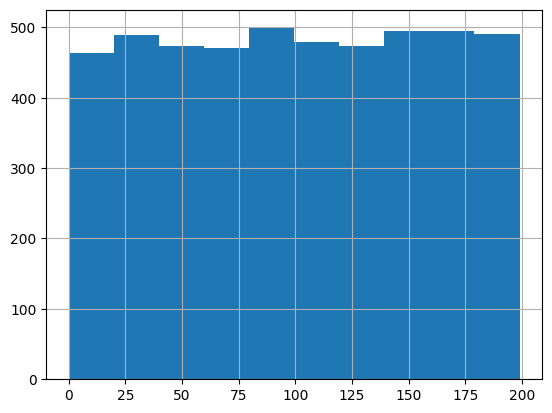

In [4]:
data.label.hist()

In [5]:
from utils.utils import get_dataloader
from torchvision import datasets, transforms
batch_size = 4
data_path = "./data"
import torchvision.transforms as transform
from torchvision.transforms import v2
import torchvision
train_transformer = transform.Compose([
                           transform.Resize((384, 380)),
                           transform.ToTensor(),
                           transform.Normalize((0.4124234616756439, 0.3674212694168091, 0.2578217089176178), 
                                               (0.3268945515155792, 0.29282665252685547, 0.29053378105163574))
])


test_transformer = transform.Compose([
                           transform.Resize((384, 380)),
                           
                           transform.ToTensor(),
                           transform.Normalize((0.4124234616756439, 0.3674212694168091, 0.2578217089176178), 
                                               (0.3268945515155792, 0.29282665252685547, 0.29053378105163574))
])
shuffle = True
compact = False

train_loader,test_loader = get_dataloader(data_path = data_path, train_transform = train_transformer, test_transform = test_transformer, batch_size = batch_size, shuffle = shuffle, compact = compact)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2616407..1.8121542].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2616407..2.5410357].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2279556..2.0821102].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.2547399..2.5545337].


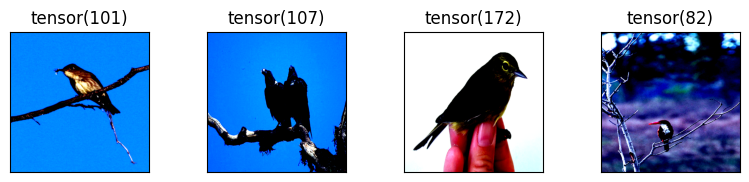

In [6]:
import numpy as np
dataiter = iter(train_loader)
images, labels = next(dataiter)
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(4):
    ax = fig.add_subplot(2, int(20/2), idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(labels[idx])

In [7]:
# import importlib
# importlib.reload(model)

In [8]:
x = [1,2,3]
y = [1,2,2]
(x==y)


False

In [9]:
# for (a,b) in train_loader:
#     print(b)
len(train_loader.dataset)

4829

In [10]:
if(not os.path.exists("./plots")):
    os.mkdir("./plots")
if(not os.path.exists("./checkpoints")):
    os.mkdir("./checkpoints")
if(not os.path.exists("./results")):
    os.mkdir("./results")

In [11]:
import torch
torch.nn.KLDivLoss

torch.nn.modules.loss.KLDivLoss

In [12]:
from self_distill_trainer import SelfDistillTrainer
from model.resnet import ResNet50

model = ResNet50(num_classes = 200)

trainer = SelfDistillTrainer(model,train_loader, test_loader, "baseline_resnet_self_distill")
trainer.train(epochs = 20)


  0%|          | 0/20 [00:00<?, ?it/s]


Validation Accuracy: 0.004152823920265781%
Epoch [1/20], Loss: 13.428819170061326, Accuracy: 0.004555808656036446%


  5%|▌         | 1/20 [16:34<5:14:57, 994.61s/it]

 10%|█         | 2/20 [30:48<4:33:31, 911.72s/it]

Validation Accuracy: 0.004152823920265781%
Epoch [2/20], Loss: 10.790221708499832, Accuracy: 0.005384137502588528%



 15%|█▌        | 3/20 [45:02<4:10:52, 885.41s/it]

Validation Accuracy: 0.0049833887043189366%
Epoch [3/20], Loss: 10.73451414803006, Accuracy: 0.004348726444398426%



 15%|█▌        | 3/20 [45:31<4:17:57, 910.44s/it]


KeyboardInterrupt: 

In [ ]:
from trainer import Trainer
from model.baseline import BirdClassifier, EfficientBirdClassifier
model = BirdClassifier()
trainer = Trainer(model,train_loader, test_loader, "baseline_efficientnet")
trainer.train(epochs = 20)

/home/endtheme/miniconda3/envs/bird/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/endtheme/miniconda3/envs/bird/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


2048


  0%|          | 0/20 [00:00<?, ?it/s]


output:  tensor([[-1.0696e-01,  7.0835e-02, -1.8013e-01,  2.0321e-03, -1.9221e-01,
         -4.4565e-02, -1.7968e-01, -1.4449e-01, -4.8634e-02, -1.1638e-01,
         -1.3548e-01,  1.4451e-01,  3.7069e-02, -2.2351e-01,  1.2221e-01,
         -1.6180e-02, -8.8184e-02, -1.1011e-01,  1.0824e-01, -8.3182e-02,
         -1.5356e-01,  5.6572e-02, -1.5067e-01,  1.7541e-01,  1.4636e-01,
          2.1725e-01,  1.6015e-01, -1.2456e-01,  1.8026e-01, -2.7869e-01,
          6.5738e-02, -1.6828e-01,  2.3533e-03, -1.3168e-02, -1.1352e-02,
          1.1873e-01,  2.6997e-03, -8.6839e-02, -1.6857e-01, -2.3046e-01,
         -8.2409e-02, -1.8597e-02,  1.8243e-03, -5.1758e-02,  1.3061e-02,
          4.5289e-02, -2.1161e-02,  1.3846e-01, -1.5976e-01, -2.5694e-01,
          4.7699e-02, -6.5665e-02,  2.4909e-01,  6.5956e-02, -2.2074e-01,
          3.8980e-02,  7.1563e-02,  1.1658e-01, -8.6559e-02,  9.5812e-02,
          7.0347e-03, -8.6216e-02, -1.0578e-02,  4.7830e-02, -1.2366e-01,
          1.1560e-01,  1.002

  0%|          | 0/20 [01:56<?, ?it/s]


KeyboardInterrupt: 

  0%|          | 0/100 [00:00<?, ?it/s]


output:  tensor([[ 0.0830, -0.0003, -0.0147,  ..., -0.0384,  0.0530, -0.0179],
        [ 0.0304,  0.0615, -0.0286,  ..., -0.0080,  0.0437, -0.0412],
        [ 0.0274, -0.0289, -0.0653,  ..., -0.0156, -0.0436,  0.0053],
        ...,
        [ 0.0854,  0.0145,  0.0178,  ..., -0.0306, -0.0608,  0.0036],
        [-0.0030,  0.0209, -0.0482,  ...,  0.0063, -0.0189, -0.0321],
        [ 0.0467,  0.0044, -0.0685,  ..., -0.0082, -0.0319, -0.0052]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([158,  83, 170, 195, 193, 186, 144, 182, 128,  64, 141,   0, 192, 167,
        112, 141, 124, 159, 149, 193, 104, 101, 167, 152, 158, 167,  86,  74,
         77, 159, 195, 160], device='cuda:0')
labels:  tensor([115,  35,  20, 105, 150,  66,   0,  87, 116, 137, 105,  76,  19,  60,
        142, 139, 155, 151,  36,   4, 167,   0, 166,  90, 115, 184, 146,  57,
        172, 136,  49, 151], device='cuda:0')
output:  tensor([[ 0.1708, -0.0892, -0.0092,  ..., -0.0300, -0.0640, -0.0925],
  

  1%|          | 1/100 [01:28<2:26:04, 88.53s/it]


output:  tensor([[-2.5487, -4.5260, -9.3697,  ...,  3.3683,  0.3674,  7.0342],
        [ 0.6333,  2.9088,  7.4980,  ..., -5.2411, -7.7171,  0.0807],
        [ 0.8714,  2.3697,  0.4389,  ...,  3.0508, -1.4058, -4.3595],
        ...,
        [ 1.0740,  7.1879,  2.1987,  ..., -0.7539,  2.2808,  8.6034],
        [-2.4612,  3.7978,  0.0129,  ...,  0.2295, -0.4078,  2.3771],
        [ 2.5512,  4.6722,  1.1203,  ...,  4.0927,  2.5821, -1.1255]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([180,  57, 172, 184,  33, 138, 183,  73,  73,   3,  47, 167, 108, 130,
        173, 171, 130, 100,  71,  30,  69,  14,  42,  74, 128,  92,  84, 106,
        176,  54, 172,  31], device='cuda:0')
labels:  tensor([180,  57, 103, 184,  33, 138, 183,  73,  73,   3,  47, 161,  54, 103,
        173,  76, 121, 100,  71,  30,  69,  14,  42, 165, 119,  92,  84, 106,
        176, 199, 178, 101], device='cuda:0')
output:  tensor([[ 0.8652,  5.3716,  2.2227,  ...,  1.5008, -0.0407,  0.9983],
  

  2%|▏         | 2/100 [02:55<2:22:59, 87.54s/it]

Validation Accuracy: 0.5938538205980066%
Epoch [2/100], Loss: 1.730055453761524, Accuracy: 0.5493891074756678%

output:  tensor([[-3.1103, -1.5510, -1.1091,  ...,  0.7825,  1.7368,  0.9673],
        [ 7.4061,  4.6798,  5.7187,  ...,  1.8433, -2.0521, -3.4759],
        [ 9.5207,  7.9824,  9.7336,  ..., -6.2310,  2.3746,  0.7952],
        ...,
        [-0.1814,  0.8997,  1.0645,  ..., -4.8939,  0.0306, -2.6575],
        [ 0.4582,  1.3781,  1.5168,  ..., -3.9193, -0.5840, -4.4998],
        [ 0.3402,  1.8930,  0.4344,  ..., -4.1447, -0.8227,  8.0518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 68,  71,  85,  45,   0,  21, 167,   1, 106,  66,   0, 165,  16,  78,
        163,  88,  27, 109,  36,  68,  46, 117, 179,  40, 140,   3,  19,  19,
         79, 139, 122,  46], device='cuda:0')
labels:  tensor([ 68,  71,  85,  45,   0,  21, 167,  44, 141,  66,  71, 164,  16,  78,
        163,  88,  27, 109,  36,  68,  46, 129,  46,  40, 140,   3,  19,  19,
         78, 139

  3%|▎         | 3/100 [04:22<2:21:05, 87.28s/it]

Validation Accuracy: 0.6511627906976745%
Epoch [3/100], Loss: 0.9649551455548268, Accuracy: 0.734106440256782%

output:  tensor([[-5.7769, -2.5187, -0.5169,  ...,  5.7196, -0.2565, -0.3069],
        [ 1.9061,  2.1685, -4.0090,  ...,  4.1773,  2.7557, -2.4868],
        [-1.2356,  5.5938,  0.7173,  ..., -0.1264,  4.6511,  1.6374],
        ...,
        [ 1.8674, -5.7485,  0.8267,  ...,  1.5641,  5.6591,  3.7184],
        [-1.9022,  4.6777, -0.1419,  ...,  4.1502,  9.3351,  4.6623],
        [ 1.1607,  3.6364, -3.0311,  ..., -3.5274, -1.9036, -2.4719]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 75,  32, 176,  50,  14, 188,  47, 153, 132, 139, 101,  33, 105, 112,
         85,  20,  24, 165,   3, 166,   5, 172,  57,  84, 163, 172,  34, 176,
        165, 152, 179, 105], device='cuda:0')
labels:  tensor([ 75,  32, 176,  50,  14, 188,  47, 153, 165, 139, 101,  33, 105, 112,
         85,  20,  24, 165,   3, 166, 110, 172,  57,  84, 163, 172,  34, 176,
        165, 152

  4%|▍         | 4/100 [05:50<2:19:53, 87.43s/it]

Validation Accuracy: 0.6818936877076412%
Epoch [4/100], Loss: 0.5650688937760346, Accuracy: 0.8299855042451854%

output:  tensor([[-8.2913, -0.5690, -2.1879,  ...,  1.7621, -2.3062,  2.8224],
        [ 4.4409,  5.3967,  3.8690,  ..., -2.7757, -1.0758,  2.9280],
        [-4.8633, -3.1833, -7.0393,  ...,  6.0450,  1.1438, -1.2615],
        ...,
        [ 5.0493,  2.7022, -4.8641,  ..., -1.5325,  1.7735, -3.5673],
        [-2.6740, -6.5328, -0.1716,  ..., -5.7094,  1.5752,  0.3014],
        [ 2.1195, -3.8390, -1.6213,  ..., -3.8001, -3.2585,  2.4759]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 78,  51,  27,   7, 119,  12, 147, 120, 112, 125, 100,   2,  19, 150,
        105,  96,   0, 141, 198,  77, 125, 117, 161, 194, 143, 114,  77,  77,
        109, 181,  26, 160], device='cuda:0')
labels:  tensor([ 78,  24,  27,   7, 119,  12, 147, 120, 112, 125, 100,  71,  19, 150,
        105,  96,   0, 141, 198,  77, 125, 117, 161, 194, 143, 114,  77,  77,
        109, 18

  5%|▌         | 5/100 [07:16<2:18:06, 87.22s/it]

Validation Accuracy: 0.6411960132890365%
Epoch [5/100], Loss: 0.4919604114596023, Accuracy: 0.857941602816318%

output:  tensor([[ 2.0992, -4.5489,  6.1299,  ..., -0.9425,  1.2005, -2.8301],
        [-0.0893,  3.2573,  1.8385,  ..., -2.4574,  0.0597,  0.1717],
        [-0.1296, -3.9628, -6.5457,  ..., -2.9846,  4.7283, -2.4935],
        ...,
        [13.8421, 13.2408,  6.2448,  ..., -1.9075, -0.0276,  4.8597],
        [-7.4137, -1.5681, -3.5492,  ...,  7.7377,  0.9197, -7.4855],
        [ 2.3586,  1.2101,  0.2482,  ...,  2.1593,  1.7734,  6.4927]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 38, 138,  17, 172, 109,  96,  82,  11, 107,  49, 187,  63,  49,  63,
         45,  78, 165, 133,  31,  89, 128,  97,  29,  20,  44,  21,  91,  42,
          2, 175, 115, 152], device='cuda:0')
labels:  tensor([ 38, 138,  17, 172, 109,  96,  82,  11, 107,  49, 187,  63,  49,  63,
         45,  78, 165, 133,  31,  89, 128,  97,  29,  20,  44,  21,  91,  42,
          0, 175

  6%|▌         | 6/100 [08:43<2:16:24, 87.07s/it]

Validation Accuracy: 0.643687707641196%
Epoch [6/100], Loss: 0.5306167559611876, Accuracy: 0.8525574653137296%

output:  tensor([[  1.9043,  -8.9639,  -1.3706,  ...,  -5.8859,   1.4808,  -2.6942],
        [ -6.1310,  -3.9912,  -6.7758,  ...,  -1.5061,  -0.7600,   2.2217],
        [  1.5834,   4.2031,  -3.2814,  ...,  -4.1459,  -1.9840,  -1.2807],
        ...,
        [ -0.1015,  -6.9989,  -1.6650,  ...,   7.0629,   3.8168,   1.9027],
        [ -3.6389,  -7.2758,  -4.3444,  ...,  -1.6747,   0.2795,   3.0849],
        [ -4.9586, -10.2503,  -4.4460,  ...,  -3.6146,  -7.3638,   2.5328]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 18, 165,  64, 177,  83, 174,  59, 157, 143,  57,  99,  74, 101,  18,
          0,  86, 172, 114, 197,  69, 148, 196, 168, 101, 147, 183, 156,  48,
        122, 195,  53,  47], device='cuda:0')
labels:  tensor([ 30, 165,  64, 177,  83, 173,  59, 157, 143,  88,  99,  74, 101,  18,
          0,  86, 172, 114, 197,  69, 148, 196, 173,  38, 

  7%|▋         | 7/100 [10:10<2:15:00, 87.10s/it]

Validation Accuracy: 0.6320598006644518%
Epoch [7/100], Loss: 0.5027017422415168, Accuracy: 0.8643611513770967%

output:  tensor([[ 9.8057e+00, -1.7231e-01, -6.0850e+00,  ..., -1.6455e+01,
         -3.9076e+00, -4.5256e-01],
        [ 5.0455e+00, -1.7448e+00,  4.4580e+00,  ...,  1.0131e+01,
          1.2439e+01, -1.8065e+00],
        [-5.4845e+00,  2.0544e-01, -7.2678e+00,  ...,  7.2015e+00,
          5.8357e+00, -2.1599e+00],
        ...,
        [ 2.2782e+00, -5.3420e-01,  2.6447e+00,  ...,  2.9086e+00,
          4.3424e+00, -2.4168e+00],
        [-6.0709e-01, -8.1387e-01, -6.0644e-01,  ...,  1.0421e+00,
         -3.1341e+00,  3.1795e+00],
        [ 9.3873e+00, -8.5883e-03, -5.2235e+00,  ...,  1.8521e+01,
          2.1515e+01,  6.7280e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([166, 192, 125, 113, 154,  82,  20,  46, 196,  14,  74,  30,  36, 136,
        100,  27,  57,  13,  13,  31,  96, 151,  35,  51, 129, 196,  26,  91,
         83,  17, 155, 104], device

  8%|▊         | 8/100 [11:37<2:13:31, 87.08s/it]

Validation Accuracy: 0.6627906976744186%
Epoch [8/100], Loss: 0.5028041052009096, Accuracy: 0.8695382066680473%

output:  tensor([[ -9.3729,   6.1115,  -4.2347,  ...,   4.3728,  -9.7541,  -0.9552],
        [  4.0428,   1.4782,   7.7667,  ...,  -6.1867,  -0.6037,  -5.5798],
        [ -4.2300,  -2.3739,  -2.4132,  ...,  -9.0402,  -9.6119,   6.7310],
        ...,
        [ -6.8705,  -1.5724,  -3.9641,  ...,  -2.5134,  -4.3191, -11.1151],
        [ -1.7789,   1.2848,  -0.1432,  ...,  -4.9391,  -1.2319,  -8.5318],
        [ -2.0969,  -4.1019,   2.9017,  ...,   0.5061,   6.0522,   4.0897]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 80,  36, 168,  25,  70, 128,  43,  76, 173,  84, 154,  84,  62, 142,
         58,  28,  52, 110, 113, 164, 171,  80,  22, 154,  73, 169,  79,  83,
        131, 119,  82, 171], device='cuda:0')
labels:  tensor([ 80,  36, 168,  25,  70, 128,  43,  76, 125, 180, 154,  70,  62, 142,
         58,  28,  52, 110, 113, 164, 171,  80,  22, 171,

  9%|▉         | 9/100 [13:04<2:11:51, 86.93s/it]

Validation Accuracy: 0.6245847176079734%
Epoch [9/100], Loss: 0.41878917083662276, Accuracy: 0.8894180989852971%

output:  tensor([[  2.7021,   7.2419,   4.1913,  ...,  -2.0050,   1.6036,  -8.5095],
        [  0.2877,  -1.6102,   5.4258,  ...,   0.2993,   6.3238,   0.7331],
        [  5.3739,   0.5105,   0.1826,  ...,   7.9421,   7.1394,  -2.8373],
        ...,
        [  2.5402,   1.7196,   8.7924,  ...,  -5.1366,   3.4509,  -3.5461],
        [ -7.3184,   3.8305,  -2.3940,  ...,   0.4734, -10.5735,   7.6377],
        [ -0.3971,   0.2516,   2.3569,  ...,  -4.6714,   0.4129,  -1.9462]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 58, 166,  24, 172, 156,  71, 115, 111,  52, 194,  98, 127, 167,   0,
         96, 155, 112, 187,  84,  59, 105, 143,  61, 128, 172, 123, 163,  18,
         46,  68,  78,  98], device='cuda:0')
labels:  tensor([ 58, 166,  24, 179, 156,  71, 115, 113, 141, 194,  98, 127, 167,   0,
         96, 155, 130, 187,  84,  59, 105, 143,  61, 128

 10%|█         | 10/100 [14:32<2:10:50, 87.23s/it]

Validation Accuracy: 0.6154485049833887%
Epoch [10/100], Loss: 0.4783216622096813, Accuracy: 0.8838268792710706%

output:  tensor([[ 2.5262, -1.7723,  3.8557,  ...,  1.2148,  1.9665,  4.0934],
        [ 2.2170,  2.3055,  2.9852,  ...,  5.6948,  0.5122, -2.4835],
        [-0.6790, -0.5624, -0.4222,  ..., -2.9686,  1.8748, -7.4728],
        ...,
        [-7.6733, -2.7234,  6.6007,  ..., -6.7751,  2.6241, -7.7925],
        [ 4.4242, -1.9523, -4.9631,  ...,  5.0180, 10.1631, -1.9212],
        [-0.5891,  5.3144,  4.5830,  ...,  7.4643, -1.7194, -2.3430]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 37,  60, 122,  48,  20,  86,  71,  33, 147, 116, 125,  95,  23,  37,
         85,  91,  90,  52, 175,  65, 194,  56, 173, 123,  20,  66, 125,  59,
        140, 161, 132,  48], device='cuda:0')
labels:  tensor([ 37,  60, 122,  48,  20,  86,  57,  33, 147, 116, 125,  95,  23,  37,
         85,  91,  90,  52, 175,  65, 194,  56, 173, 123,  20,  66, 125,  59,
        140, 1

 11%|█         | 11/100 [16:00<2:09:47, 87.50s/it]

Validation Accuracy: 0.6719269102990033%
Epoch [11/100], Loss: 0.4285983544657167, Accuracy: 0.8927314143715055%

output:  tensor([[  8.0793,   4.1270,  -7.0814,  ...,  -9.1779,  -1.4854,  -6.5759],
        [ -2.6308,   6.7323,  -7.4585,  ...,  -5.2337,  -3.5056,  -3.8101],
        [  0.0441,  -7.2319,  -4.7324,  ...,  -3.0809,  -1.5541,  -7.7234],
        ...,
        [  0.1613,  -1.0405,   3.8050,  ...,  -6.7754,   4.4456,   8.0426],
        [-10.5759,  -1.3768,   8.2189,  ...,  -6.4174,  -7.5124,  -7.4508],
        [  0.4656,  -1.9611,  -4.0879,  ...,   3.2286,  -1.1937,  -2.8040]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([  3, 190, 128, 183, 161, 171, 102, 187,  32, 111,  96,   9,  55,  71,
        185, 153,  50, 146,  98,  44, 100, 164, 153, 157,  51, 139,  47,  82,
        121,  89, 158,  73], device='cuda:0')
labels:  tensor([  3, 190, 128, 183, 161, 171, 102, 187,  32, 111,  96,   9,  55,  71,
        185, 153,  50, 146,  98,  44, 100, 164, 153, 157

 12%|█▏        | 12/100 [17:28<2:08:33, 87.66s/it]

Validation Accuracy: 0.6254152823920266%
Epoch [12/100], Loss: 0.5064057575366059, Accuracy: 0.8798923172499482%

output:  tensor([[ -2.4429,  -3.4213,  -8.1176,  ...,  -5.6511,  -8.4381,  -6.9764],
        [  8.5747,  -8.7350,  -7.2989,  ...,   1.9161,   9.8703,   8.5206],
        [ -2.4705,   4.7413,  11.0189,  ...,   6.1799, -14.4050,  10.0850],
        ...,
        [ -8.3048,  -4.8164,   0.8773,  ...,  -7.0476,  -8.5067,  25.4940],
        [ -0.8916,   0.1266, -22.6848,  ...,  -0.5734, -14.8326, -26.8105],
        [ -8.2760,  -5.2894,   0.2789,  ...,   1.4413,  -6.6868,   9.1858]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 17, 152, 110, 134,  89, 164,  96,  59,  45, 102, 135,  37,  37, 155,
         20,  25,  45,  57,  94,  36, 105, 112, 124,  42, 126,  62,  18,  18,
        107,  19, 116, 186], device='cuda:0')
labels:  tensor([ 17,  76, 110, 134,  89, 164,  96,   3,  45, 102, 135,  37,  37, 155,
         20,  25,  45,  57, 138,  36,  21, 158, 124,  42

 13%|█▎        | 13/100 [18:56<2:07:04, 87.64s/it]

Validation Accuracy: 0.6121262458471761%
Epoch [13/100], Loss: 0.5212880457868639, Accuracy: 0.8850693725408988%

output:  tensor([[ -2.1530, -11.7476,  -8.7227,  ...,   7.7327,  -1.1917,  -6.6267],
        [ 21.8363,  10.7252,  19.3339,  ...,  15.3113,   9.8910,  -1.8703],
        [  2.3435,  -0.9706,   6.3778,  ...,   5.3180, -11.5198,  -0.1796],
        ...,
        [  9.8716,  -8.8449, -11.1333,  ...,   2.0881,  -3.2153,   8.1611],
        [ 23.8974,  14.9588,  12.3294,  ...,  -4.7809,  -3.2624,  22.6483],
        [  3.5848, -16.9446, -12.8891,  ...,  10.1233,  -9.5380,  -5.4539]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([128,  10,  78,  56, 124, 173, 158,  16,  36,  32,  34, 123, 172,  99,
         87, 138, 169,  59,  42,  57, 108,  41,  17,   0, 168, 150, 136, 117,
        132,  31,  50, 120], device='cuda:0')
labels:  tensor([128,  10,  78,  97, 124, 173, 158,  16,  36,  32,  34, 123, 172,  99,
         87, 138, 169,  59,  42, 141, 108,  41,  17,   0

 14%|█▍        | 14/100 [20:23<2:05:21, 87.46s/it]

Validation Accuracy: 0.606312292358804%
Epoch [14/100], Loss: 0.5477279582437103, Accuracy: 0.8838268792710706%

output:  tensor([[-7.8640e-01,  5.1928e+00,  1.2907e+01,  ..., -3.3734e+00,
         -4.7929e+00,  1.1057e+01],
        [ 2.1475e+00, -4.3664e+00,  2.0319e+00,  ...,  3.1024e+00,
         -1.1851e+01, -1.1984e+01],
        [ 1.3724e+00,  4.7819e+00,  4.0897e+00,  ..., -3.0067e+00,
          7.0671e+00,  2.4649e-02],
        ...,
        [ 2.2844e+00,  1.3674e+00,  3.9810e+00,  ...,  4.6446e-01,
         -4.0898e+00, -3.0396e+00],
        [ 7.2501e+00,  3.2533e+00,  9.2932e+00,  ..., -9.6325e+00,
          1.9162e+00, -7.7632e-01],
        [-2.6242e+00,  3.9814e+00,  6.0320e+00,  ...,  8.5149e-01,
          6.6132e-01,  4.3901e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([176,   3, 158,  42,  10, 189, 106, 161,  91, 125, 140, 177, 173,  15,
        197, 194, 145, 123,  53,  22, 190, 161, 126,  51,  69, 130,  51,   5,
         77,  82,  96, 199], device

 15%|█▌        | 15/100 [21:50<2:03:57, 87.50s/it]

Validation Accuracy: 0.6411960132890365%
Epoch [15/100], Loss: 0.5058601689309079, Accuracy: 0.8896251811969352%

output:  tensor([[ -1.5159,   2.6323,   0.8421,  ...,  -7.6757, -11.0821,  -4.9629],
        [ -2.7884,  -3.0096,  -4.8190,  ...,   3.8424,  -6.9209,  -0.1786],
        [ -1.9118,  -2.1210,  -0.6302,  ...,   1.3069,   0.3140, -12.2523],
        ...,
        [  1.6315,   3.5478,   1.9834,  ...,   7.7064, -13.5019,  -3.3311],
        [  6.6531,   8.7784,   0.5433,  ...,  -2.9700,  -7.6565,  -4.1233],
        [ -9.1780,   0.9003,  -8.4697,  ...,  -3.5990,   1.8941, -10.0605]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([156, 113,  13,  76, 108, 128,  11, 198, 152, 197, 122, 172,  71,  77,
        132,  73, 155,   1, 168, 169,  10,  37,  94,  24, 190, 172,  85, 188,
        156,  59,  29, 122], device='cuda:0')
labels:  tensor([156, 113,  13,  76, 108, 128,  11, 198, 152, 197, 122, 172,  71,  77,
        132,  73,  25,   1, 168, 169,  10,  37,  94,  24

 16%|█▌        | 16/100 [23:17<2:02:20, 87.38s/it]

Validation Accuracy: 0.6636212624584718%
Epoch [16/100], Loss: 0.3481889590975637, Accuracy: 0.9173741975564299%

output:  tensor([[ -1.9329,  -0.1170,   0.0495,  ...,   5.2126,   4.2645,   6.2389],
        [ -1.0793,  -4.4418,  -7.0447,  ...,   0.8526,  -4.6055,  -2.0815],
        [  1.4482,   3.7636,   1.4620,  ...,  -9.9839, -14.9625,   4.6139],
        ...,
        [  1.4212,  -1.1601,  -4.8851,  ...,   1.0802,  -8.6405, -14.4629],
        [ -4.9842,   0.9370,  -1.3980,  ...,  -5.6472, -12.4072,   6.2594],
        [  7.6342,  11.6288,   1.4545,  ...,  -3.4488,   2.6182,  -6.1890]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([196, 187,  74, 118, 154, 107, 124,  85, 123, 191, 187,  41, 167, 158,
         86, 180, 156, 152, 160,  65,  76, 169,  14, 159,  81, 181, 155,  99,
        152,  78,  66,  62], device='cuda:0')
labels:  tensor([196, 187,  74, 118, 154, 107, 124,  85, 123, 191, 187,  41, 167, 158,
         86, 180, 156, 152, 160,  65,  76, 169,  14, 159

 17%|█▋        | 17/100 [24:45<2:01:04, 87.52s/it]

Validation Accuracy: 0.6777408637873754%
Epoch [17/100], Loss: 0.3113827006070295, Accuracy: 0.9264858148685028%

output:  tensor([[ -7.9106,   2.3414, -11.1083,  ...,   9.5518,   5.1134,  -1.0384],
        [  1.3198,   0.2531,   2.3591,  ...,  -2.6615,  -2.4650,   8.9591],
        [  0.5980,   3.9818,   9.4950,  ...,  -5.0356,  -3.5712,  -4.0517],
        ...,
        [  7.0493,   2.5460,   4.2265,  ...,  12.3878,   4.0787,  -6.1295],
        [-17.2264,  -3.7530,  -7.6865,  ...,  -0.0428,  -5.1373,   9.5086],
        [  5.1691,  -0.5990,   6.8542,  ...,  13.2500,   2.9265,   3.9593]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 61, 189, 140,  87, 182, 167,  49, 126, 117, 137, 185,  81,   5,   0,
         51,  64,  30, 168, 151,  72, 145, 183,   2, 109, 145,  60, 162,  60,
         32,  21,  73,  22], device='cuda:0')
labels:  tensor([ 61, 189, 140,  87, 182, 167,  49, 126, 117, 137, 185,  81,   5,   0,
         51,  64,  30, 168, 151,  72, 145, 183,   6, 109

 18%|█▊        | 18/100 [26:13<1:59:56, 87.76s/it]

Validation Accuracy: 0.6312292358803987%
Epoch [18/100], Loss: 0.3524549285490343, Accuracy: 0.9223441706357424%

output:  tensor([[  2.6343,   4.5875,   8.4421,  ...,   0.6747,  -3.0990,   5.4984],
        [ -0.4218,   2.6163,   4.0230,  ..., -11.1557,   0.7993, -10.0793],
        [-16.0623,  -3.2764,   7.3871,  ..., -10.5367,  -2.9244, -12.4254],
        ...,
        [  0.5086,  -0.6573,  -5.5317,  ...,   4.5582, -14.0829, -10.2303],
        [ -0.7136,   6.3166,   4.8386,  ...,  -0.7384, -12.7343,   2.8717],
        [ -2.5414,   5.2762,  -0.1983,  ...,  -6.1286,  -7.0780,  -2.9318]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([185,  14, 191,  57,  93, 113,  91,  17,  98, 147,  48,  85, 162,  27,
        155, 176, 145, 181,  89,  77,  88,  31,  47,  71,  84,  23, 136, 183,
        198, 107, 145,  69], device='cuda:0')
labels:  tensor([185,  14, 191,  57,  93,  84,  51,  17,  98, 147,  48,  85, 162,  27,
        155, 176, 145, 181,  57,  77,  88,  31,  47, 106

 19%|█▉        | 19/100 [27:43<1:59:05, 88.21s/it]

Validation Accuracy: 0.6835548172757475%
Epoch [19/100], Loss: 0.3591231763091506, Accuracy: 0.9213087595775523%

output:  tensor([[ -1.1415,  -1.7522,  11.1893,  ...,   1.7227,  -4.3097,   7.2554],
        [  3.6891,  -5.5643,  -2.0808,  ...,  -0.0979,   0.0407,  -6.6770],
        [-10.2772,  -9.9898, -10.7181,  ...,   2.2807,   1.5681,  -8.8982],
        ...,
        [  2.5326,   9.3118,  16.9820,  ...,   0.3680, -23.4497,   0.4460],
        [  2.4168,   3.6049,  19.2988,  ...,  -3.7493,  -7.9146,  12.1771],
        [ -3.8703, -12.0777,  -8.8647,  ..., -10.2480,   0.9856,  -4.0627]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([102, 123, 126, 169, 121, 196,  81, 128,  49, 173, 178, 114,  31,  87,
         52,  10, 132, 120,  37,  81, 191,  27,  91, 194, 128,  66, 183,  75,
        124,  73,  78, 120], device='cuda:0')
labels:  tensor([102, 123, 126, 169, 121, 196,  81, 128,  49, 173, 178, 114,  31,  87,
         52,  10, 132, 120,  37,  81, 191,  27,  91, 194

 20%|██        | 20/100 [29:17<2:00:01, 90.02s/it]


output:  tensor([[  9.6818,  -3.8267,  22.5730,  ...,  -0.8194,  -4.3586,  -4.1072],
        [ -6.9015,   2.2087,   3.5231,  ...,   1.2559, -16.4714, -11.7311],
        [ -4.4715,  -5.5474,   1.4294,  ...,   3.7435,  -5.7292,  -3.7632],
        ...,
        [  3.1057,  -0.1201,  -4.5429,  ...,  -2.3326,   7.8319,  -8.4103],
        [  1.8566,   0.0486,   4.7952,  ...,  22.5492, -13.8269,  -4.9364],
        [ -3.9826, -17.0206,  -3.3557,  ...,  11.1068, -10.7158,  -1.8702]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([  5, 159, 193, 190, 146, 119, 185,  90, 133, 180,  84, 198,  72,  32,
         68, 154, 107, 171,  75, 118, 123, 175, 160, 143,  81, 188,   9, 117,
         44, 139, 117, 147], device='cuda:0')
labels:  tensor([  5, 159, 193, 190, 146, 119, 185,  90, 133, 180,  84, 198,  72,  32,
         68, 154, 107, 171,  75, 118, 123, 175, 160, 143,  81, 188,  11, 117,
         44, 139, 117, 147], device='cuda:0')
output:  tensor([[ 11.6491,  28.7690,   0.713

 21%|██        | 21/100 [30:50<1:59:42, 90.91s/it]

Validation Accuracy: 0.6719269102990033%
Epoch [21/100], Loss: 0.4090998224938745, Accuracy: 0.9146821288051357%

output:  tensor([[ -0.3077,  -6.4454,   0.4858,  ...,  -7.1938,  -8.9711,  11.9492],
        [  1.3422,  11.3837,   6.2147,  ...,  -4.5840,   7.2454,  -6.2573],
        [ -7.6342,   6.7148,  -9.6240,  ...,  -4.5079, -13.6536,  -0.7884],
        ...,
        [ -0.2510,  -2.5685,  -2.1898,  ..., -10.5503,   2.6231,  -9.2273],
        [ 11.6720,   9.3172,  -5.0279,  ...,   2.5464,   0.0820,  -8.9331],
        [ 15.7884,   5.1908,   5.9809,  ..., -18.7540,   6.9658,  -7.1376]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 95, 152, 153,  76, 186,  26,  64, 119, 120, 106,  88, 194, 102, 111,
        103, 121,  18,  65,  23,  73,  22,  47, 170, 129, 138,  63, 114,  85,
         81, 138,  32,  33], device='cuda:0')
labels:  tensor([ 95, 152, 153,  76, 186,  26,  64, 119, 120, 106,  88, 194, 102, 111,
        103, 121,  18,  65,  23,  73,  22,  47, 170, 129

 22%|██▏       | 22/100 [32:19<1:57:30, 90.39s/it]

Validation Accuracy: 0.6428571428571429%
Epoch [22/100], Loss: 0.4168733234979083, Accuracy: 0.9171671153447919%

output:  tensor([[ 2.6395e+00, -7.9624e-01, -6.3127e+00,  ...,  1.7096e+00,
          7.5904e+00,  1.6154e+00],
        [ 8.4712e+00,  2.7211e+00, -7.7265e+00,  ...,  3.0361e+00,
         -9.2211e+00, -1.7830e+01],
        [-1.3253e+01,  9.7694e+00, -1.0244e+01,  ..., -1.3266e+01,
          1.2177e+01,  1.5847e-01],
        ...,
        [-7.8656e+00, -1.5886e+01, -1.4915e+00,  ...,  5.5079e+00,
          3.4756e+00,  1.2331e+01],
        [-7.7681e+00,  2.5346e+00, -1.6769e+00,  ..., -2.1669e+01,
          2.5404e+01, -1.4724e+01],
        [-3.2924e-03,  3.4310e+00, -2.4477e+00,  ..., -1.3416e-01,
          1.1166e+01,  6.7681e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([179, 106, 100, 101, 102, 169, 171, 151,  17,  82, 188,  63,  90,  64,
        159, 185, 188, 146,   4, 145,   5, 176, 173, 136, 182,  19, 148,  30,
        118, 147, 119,  42], devic

 23%|██▎       | 23/100 [33:48<1:55:22, 89.90s/it]

Validation Accuracy: 0.659468438538206%
Epoch [23/100], Loss: 0.4074401442171229, Accuracy: 0.9196521018844481%

output:  tensor([[ 11.2551,  13.2723,  14.4915,  ...,  14.3504,  10.0017,  38.9243],
        [-12.5435,   0.4229,  -4.1990,  ..., -23.6586,   8.6831, -10.2373],
        [ -0.9249,  10.3076,  -8.8881,  ...,   1.2580,  18.5545,  -0.5837],
        ...,
        [  6.0041,  58.3411,   3.6877,  ...,  -6.3371,   8.8229,  -4.4256],
        [  9.1770,  -4.4982,  15.4511,  ...,   8.4884,  11.8248,   6.4568],
        [ -1.2643,  14.5122,  -7.5084,  ...,  11.8528,  -8.2690,  -0.4617]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([199,  56,  21,  72, 116, 117, 111, 191,  12, 117,  30,  39, 196, 190,
        168,  55,  72, 180,  37, 110,   9, 126,  58,  48, 159, 133, 100, 108,
          3,   1, 171, 111], device='cuda:0')
labels:  tensor([199,  56,  21,  72, 115, 117, 111, 191,  12, 117,  30,  39, 196, 190,
        168,  55,  72, 180,  37, 110,   9, 126,  58,  48,

 24%|██▍       | 24/100 [35:16<1:53:09, 89.34s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [24/100], Loss: 0.33280440692678837, Accuracy: 0.9322841167943674%

output:  tensor([[ 13.5366,  -2.2019, -10.3153,  ...,   7.7209,   5.2295,  -4.3140],
        [ 12.9228,  -6.8529,   6.7783,  ...,   2.4001,   5.1931,   2.9686],
        [ 17.2942,   5.0301,   8.8185,  ...,  -3.3926,  -7.3000,   9.4203],
        ...,
        [ -4.3607,   2.6122,   2.8755,  ...,   1.5181,  -5.2682,   2.0090],
        [ -2.9745,   0.4909,  -1.0377,  ..., -11.8149,   4.2700,   7.5919],
        [ 10.8470, -10.1800,  -0.6192,  ...,  11.3067,  -3.1063,  -0.4087]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([148, 184,  51, 155,  22,  71, 174,  74,   7,  35,  87, 165, 132,  73,
         87, 175,  61,   3,  76,  19,  41, 191, 138, 154,  39,  35, 157,  67,
        187, 112, 125,  29], device='cuda:0')
labels:  tensor([148, 184,  51, 155,  99,  71, 174,  74,   7,  35,  87, 165, 132,  73,
         87, 175,  61,   3,  76,  19,  41, 191, 138, 11

 25%|██▌       | 25/100 [36:44<1:51:16, 89.02s/it]

Validation Accuracy: 0.6270764119601329%
Epoch [25/100], Loss: 0.33154249792097584, Accuracy: 0.9366328432387658%

output:  tensor([[-3.5909e+00,  3.0884e+00, -5.7261e+00,  ...,  3.5197e+00,
         -6.3425e+00, -1.4092e+00],
        [ 3.0249e+00, -6.8046e+00,  1.4039e+00,  ..., -4.0607e+00,
         -1.8835e+01, -3.0613e+00],
        [-3.2983e+00,  5.6346e+00,  4.5274e+00,  ..., -8.7274e+00,
         -1.7156e+01, -9.2229e+00],
        ...,
        [ 6.2012e+00, -1.6018e+00,  3.1093e+01,  ..., -5.2425e+00,
         -1.4145e+01, -5.2798e+00],
        [-4.5177e+00, -3.7759e+00,  4.3248e+00,  ...,  6.0080e+00,
         -3.9961e+00,  1.3318e-02],
        [ 1.7915e+01,  9.0320e+00, -6.2608e+00,  ..., -1.9617e+00,
          2.4381e+00, -2.3836e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([153,  77,  71,  60,  44,  95,   3, 189, 188,   1, 140, 119,  75,  73,
        111,  74,  46,  92, 108, 193,  27, 185,  53,  42, 123, 170,  33,  25,
        141,   2, 128,  89], devi

 26%|██▌       | 26/100 [38:13<1:49:34, 88.84s/it]

Validation Accuracy: 0.6528239202657807%
Epoch [26/100], Loss: 0.35386204080367445, Accuracy: 0.9337336922758335%

output:  tensor([[ -9.5726,   9.4209,  -6.1711,  ..., -15.7620, -11.7059,   0.8031],
        [ -6.9713,  -2.4213,  -2.5853,  ...,   5.2946,   2.9070,   0.8520],
        [ 11.3052,  11.3633,   2.3014,  ...,  -3.0328,   2.3425, -10.6186],
        ...,
        [  9.0273,  20.6662,   3.3505,  ...,   4.9411,  -0.6406,  -5.7356],
        [ -3.1919,   5.8635,  -8.7844,  ...,  -0.5698,   6.0374,  19.6204],
        [ -8.3036,  -1.4188,  -5.6709,  ...,  -2.9911,  -3.2966, -13.4888]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([142, 174,  34,  85, 154,   4,  80,   6, 176, 150, 120, 187, 191,  43,
        127,  93, 198,  10, 199,  36, 190, 154,  68,  53,  39,  30,  38, 148,
        191,  58, 152,  14], device='cuda:0')
labels:  tensor([142, 174,  34,  85, 154,   4,  80,   6, 176, 150, 120, 187, 191,  43,
        127,  93, 198,  10, 199,  36, 190, 154,  68,  5

 27%|██▋       | 27/100 [39:41<1:48:00, 88.77s/it]

Validation Accuracy: 0.6536544850498339%
Epoch [27/100], Loss: 0.418332539478761, Accuracy: 0.9211016773659143%

output:  tensor([[  5.9251,  -4.1655,   1.9313,  ...,   3.1179,  -8.0651,   3.1789],
        [ -4.2264,   3.8142,  -6.9643,  ...,  -5.3101,   4.9502,   8.5543],
        [  3.0053,   8.9255,  -7.0693,  ...,   5.4612,   9.7242,  -0.6114],
        ...,
        [ -3.1641,  -5.2463,   1.8135,  ...,   1.6347,  -6.2210,  -7.4365],
        [ -0.5167,  -1.4321,  -4.9135,  ...,   1.1457,   3.1590,   1.7527],
        [ 12.2853,   1.8327,   6.7684,  ...,  -9.8596,  -1.8969, -12.9327]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 24, 169, 177, 117,  45, 122,  87,   8, 100,  10, 153,  29,  40, 102,
         74,   5, 133, 111,  87,  68, 174, 191,  31, 118,  75,  35, 188,  56,
        188,  35, 132,   5], device='cuda:0')
labels:  tensor([ 24, 169, 177, 117,  45, 122,  87,   8, 100,  10, 153,  10,  40, 102,
        151,   5, 133, 111,  87,  68, 174, 191,  31, 118,

 28%|██▊       | 28/100 [41:09<1:46:13, 88.53s/it]

Validation Accuracy: 0.6187707641196013%
Epoch [28/100], Loss: 0.34224985805635005, Accuracy: 0.9320770345827294%

output:  tensor([[ 4.7735e-01, -2.4331e+00, -3.9610e+00,  ...,  9.7821e+00,
          1.1401e+01, -2.6701e+00],
        [ 6.0991e+00, -1.0074e+01, -7.2442e+00,  ..., -8.2914e+00,
          2.3217e+00, -2.0107e+01],
        [ 1.7244e+00, -2.9705e+00,  1.1394e+00,  ...,  3.1911e+01,
          7.1718e+00,  5.2760e+00],
        ...,
        [ 1.3909e+01, -1.6608e+01, -1.3594e+01,  ...,  1.4764e+01,
         -1.0113e+01, -1.6884e+01],
        [-5.5940e+00, -7.3126e+00, -4.5264e+00,  ..., -9.7305e+00,
          2.3700e-01, -6.8229e+00],
        [ 8.0764e+00,  1.4326e+01,  2.4280e-02,  ..., -1.7122e+00,
         -4.1795e+00, -5.6232e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 23,  14, 197,  95,  35,  88, 117, 162,  90, 184, 148,  94,  93, 116,
         14,  85, 114, 107, 161,  44,  70,  87,  28,  11,  93, 142,  17, 114,
         86,  30, 161,  65], devi

 29%|██▉       | 29/100 [42:38<1:44:42, 88.49s/it]

Validation Accuracy: 0.6254152823920266%
Epoch [29/100], Loss: 0.3619705562696435, Accuracy: 0.929592048043073%

output:  tensor([[ 10.7467,   7.2105,  -6.1367,  ...,  -0.7453,  -4.0714,  -4.2614],
        [ 20.6403,  -3.9496,  -1.5336,  ...,   2.5607, -13.5750,  -4.4402],
        [ -8.0245, -10.6659, -14.3621,  ...,   8.8380,   6.7216,  37.8086],
        ...,
        [ -2.2014,  -0.8077,  -6.1616,  ..., -17.8590,   5.8275,  -6.2682],
        [ -3.0852,   5.2538,  -4.1794,  ...,  -2.4729,  -2.1774,  12.6306],
        [ -5.4485,  -1.2149,   6.8861,  ..., -19.4840,   0.7911,   5.4273]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 21, 106, 169,  43,  22,  27,  77, 101,  10, 113, 166, 183, 165, 121,
         32,  47, 104,  28,  52,  77,  32, 114, 194,  11, 176, 132,  86,  36,
         61,  56,  79,  96], device='cuda:0')
labels:  tensor([ 21, 106, 169,  43,  22,  27,  77, 101,  10, 113, 166, 183, 165, 132,
         32,  47, 104,  28,  52,  77,  32, 114, 194,  11,

 30%|███       | 30/100 [44:05<1:42:47, 88.11s/it]

Validation Accuracy: 0.6470099667774086%
Epoch [30/100], Loss: 0.3836654095335352, Accuracy: 0.9331124456409194%

output:  tensor([[-15.0261,   8.2015,   3.9005,  ...,   3.2343,  -0.4339,  -3.1130],
        [-10.3156,  10.3499,  11.6010,  ..., -11.0513,  16.3929,  -1.7792],
        [ -6.2437,  -2.7746,  18.2489,  ...,   0.5334,  14.6374,  21.9261],
        ...,
        [ -8.5412,  15.4041,  10.1102,  ..., -12.9643,   3.9642,  12.1924],
        [-13.0790,  -3.6682,  -4.0065,  ...,  -0.1492,  -9.6185,  -7.3640],
        [  4.4359,  -2.7443,  21.8314,  ..., -11.9234,  -3.4014,   3.6427]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 93,  64, 172,  95, 172, 105,  61,  35,  91,  76,  35,  92,   5, 146,
         32,  30, 170, 182,  10,  15, 142, 187,  31,  29, 180, 130, 149,  59,
        113, 172,  48, 175], device='cuda:0')
labels:  tensor([ 93,  64, 172,  95, 172, 105,  61,  35,  91,  76,  35,  92,   5, 146,
         32, 134, 170, 182,  10, 139, 142, 187,  77,  29

 31%|███       | 31/100 [45:32<1:41:08, 87.95s/it]

Validation Accuracy: 0.6586378737541528%
Epoch [31/100], Loss: 0.4461262000798686, Accuracy: 0.9266928970801408%

output:  tensor([[  4.8966, -11.1831, -10.1898,  ..., -10.1503,   3.9045, -14.8871],
        [-15.0402,   9.3407,  -4.6916,  ...,  23.3760,  -6.4025, -14.1562],
        [  2.1199,  -5.5501,   5.9760,  ...,  20.6598,   4.6742,  -3.7176],
        ...,
        [ -5.4054,   0.6822,  -9.3250,  ...,  -2.9063,  -9.1166,   5.0839],
        [-20.0763,  -7.9321, -19.0839,  ...,  20.4327,   7.8754,  -4.1497],
        [ -4.3485,  -0.1905,   6.8859,  ...,  13.3136,   8.1862,  10.9761]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 69,  91,  45, 136, 145, 154, 185,  30,  70, 128,   6,  95,  21,  32,
        191,  82, 105, 144, 155,  52,  60,  28,  64,   9, 141,  60, 105,  23,
         24, 136, 170, 196], device='cuda:0')
labels:  tensor([ 69,  91,  45, 136, 145, 154, 184,  30,  70, 128,   6,  95,  21,  32,
        191,  82, 105, 144, 155,  52,  60,  28,  64,   9

 32%|███▏      | 32/100 [47:00<1:39:43, 87.99s/it]

Validation Accuracy: 0.6686046511627907%
Epoch [32/100], Loss: 0.40201483842939006, Accuracy: 0.9329053634292814%

output:  tensor([[ 13.8543,  28.9425,  18.2094,  ..., -17.7163,   9.9585, -10.4354],
        [  4.3196,  -4.8075,  -6.0631,  ...,   3.2282,  -3.8186,  -6.0111],
        [  5.9885,   7.2220, -17.0528,  ...,  41.3214,   0.1113,  -7.5568],
        ...,
        [  2.1393,   4.6069,  -4.8584,  ...,  -3.8462,   9.2545,  -6.8439],
        [  3.0806,   3.2868,   5.0924,  ..., -23.8463,   2.5757,  12.6625],
        [ -8.9797,  11.9259,   4.1614,  ...,   0.6885,  -4.0726, -24.9471]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([140,  31, 197,  52, 120, 189, 108,  28, 141,  32,  36, 159, 156,  43,
        103, 148, 135, 141,  29,  28,  74,   0, 128,  44, 158, 124,  70,  63,
        196, 100, 152, 190], device='cuda:0')
labels:  tensor([140,  31, 197,  52, 120, 189, 108,  28, 141,  32,  36, 159, 156,  43,
        112, 148, 135, 141,  29,  28,  74,  71, 128,  8

 33%|███▎      | 33/100 [48:28<1:38:02, 87.81s/it]

Validation Accuracy: 0.6569767441860465%
Epoch [33/100], Loss: 0.3791884454079003, Accuracy: 0.938703665355146%

output:  tensor([[-14.9293,  24.2182,  -1.3055,  ...,   3.2691,   5.5394,   3.9671],
        [ -1.3009,  32.1733,   7.3875,  ...,  -5.5389,   4.0504, -23.1752],
        [  5.9716,   2.0364,   1.8570,  ...,   4.0995,  -0.7068,  -7.2869],
        ...,
        [-15.7036,  -1.2433, -12.8331,  ...,  14.5973,  16.3682,  23.0070],
        [ 10.5579,  -1.7921,   2.8377,  ...,  12.9603,   0.8196,  -4.3273],
        [ -6.2921,  -3.3043,   3.7147,  ...,  -0.7294,   3.2149,  -0.4768]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([145,  58, 112, 110, 173,  66, 120,  95, 151, 170,  22, 175, 159,  20,
        163,   7,  73,  79,  18,  54, 184, 106,   8,  27,  17, 170, 182, 102,
        152, 169, 149, 151], device='cuda:0')
labels:  tensor([145,  58, 112, 110, 173,  66, 120,  95, 151, 170,  22, 175, 159,  20,
        163,  59,  73,  79,  18,  54, 184, 106,   8,  27,

 34%|███▍      | 34/100 [49:56<1:36:46, 87.98s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [34/100], Loss: 0.3644614578619355, Accuracy: 0.938910747566784%

output:  tensor([[ -3.9033,  -9.0597, -33.0278,  ...,   1.4288,  14.4390,   5.9738],
        [ -3.4987,  -6.7211, -13.8113,  ...,   2.7192,   3.3292,   2.7339],
        [ 42.4825,  27.1386,  10.6993,  ...,  -6.9343,  18.7894,  -0.5034],
        ...,
        [ -0.7673,  -0.8324,   8.0841,  ...,  13.4819, -10.3422, -22.8384],
        [ 20.3726,  -0.6297,  27.2724,  ...,   2.5323,   2.7814,  -7.5629],
        [  3.0951,  -0.3714,  -4.5545,  ...,   0.1643,  11.0213,   6.5050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 87,  67,   0, 175,  35,  76, 133,  69,  48,  78,  77,  59,  62, 116,
         37, 144, 151,  92, 188,  80, 126,  45, 126, 105,  14,  70, 194, 161,
         27,  35,  85, 160], device='cuda:0')
labels:  tensor([ 87,  67,   0, 175,  35,  76,  69,  69,  48,  78,  77,  71,  62, 116,
         37, 144, 151,  92, 188,  80, 126,  45, 126, 105,

 35%|███▌      | 35/100 [51:24<1:35:21, 88.02s/it]

Validation Accuracy: 0.6511627906976745%
Epoch [35/100], Loss: 0.38329645190382183, Accuracy: 0.9353903499689377%

output:  tensor([[ 7.1245e-01,  7.6576e+00,  5.3299e+00,  ...,  9.9658e+00,
          4.6037e+00,  2.5399e+00],
        [-1.1120e+00,  2.1315e+00,  1.0812e+00,  ..., -1.1781e+01,
          7.4741e+00,  2.9241e+00],
        [-1.0683e+01, -1.0035e+01,  3.2499e+00,  ...,  7.1142e-01,
         -2.0702e+01,  1.6116e+00],
        ...,
        [-1.3932e-02,  5.7626e+00,  8.7928e+00,  ..., -8.1433e+00,
          1.1663e+01, -8.5673e-01],
        [ 2.0195e-01, -1.0152e+01,  1.1540e+00,  ..., -2.5935e+00,
         -9.7960e+00, -1.5556e+01],
        [ 9.6979e+00,  4.0582e+00,  2.4281e+01,  ...,  9.6072e+00,
          1.0209e+01,  1.2496e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([189, 121,  47, 193, 182,  16, 179,  37, 162, 140, 128, 164, 171, 180,
         73, 196,  54, 129, 160,  53,  47, 146, 138,  60,  50,  87, 102, 121,
        181, 176, 184,  73], devi

 36%|███▌      | 36/100 [52:53<1:34:13, 88.34s/it]

Validation Accuracy: 0.6187707641196013%
Epoch [36/100], Loss: 0.41554444676778723, Accuracy: 0.9353903499689377%

output:  tensor([[ 18.1433,   8.2905, -16.8836,  ...,  11.8415,  13.6360,  12.6082],
        [  5.9676,   2.5065, -26.1723,  ..., -27.0822,  -0.0520, -31.7848],
        [  0.8728,  -5.8540,   4.0438,  ...,   1.8345,  14.5750,  -0.9367],
        ...,
        [  4.1620,   3.3051,   5.0432,  ...,  11.5111,   7.1878,  -8.0786],
        [-16.7783,  -7.6879, -13.6459,  ...,  14.8979,  -3.2172,  -4.1139],
        [-16.6989,   9.0670,  15.3876,  ...,  -6.9883, -16.1204,  18.0267]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([136,  55, 174,  95, 184,  37,  82, 101, 193,  23,  47, 151,  17,  72,
         56, 108,  96, 144,  44, 109,  96,  32, 157,  38,  61,  98, 101,  14,
         61, 176, 111, 146], device='cuda:0')
labels:  tensor([136,  55, 174, 199, 184,  37,  82, 101, 193,  50,  47, 151,  17,  72,
         56, 108,  96, 144,  44, 109,  96,  32, 157,  3

 37%|███▋      | 37/100 [54:21<1:32:28, 88.07s/it]

Validation Accuracy: 0.632890365448505%
Epoch [37/100], Loss: 0.45239625107466136, Accuracy: 0.9318699523710913%

output:  tensor([[-2.9078e+00, -1.3155e+01, -5.3859e+00,  ...,  4.4736e+00,
          1.7337e+01, -1.2833e+00],
        [-6.2405e-01, -6.6337e+00, -8.7612e-03,  ..., -8.3409e+00,
         -4.0130e+00, -2.5640e+00],
        [-1.0457e+01,  1.0016e+00, -1.1976e+01,  ..., -6.5903e+00,
          1.0826e+01, -1.1538e+01],
        ...,
        [-1.1516e+00,  1.5269e+00, -1.3765e+01,  ..., -1.8099e+01,
         -1.0286e+01, -5.8485e+00],
        [-2.0639e-01,  4.7157e+00, -9.4274e+00,  ..., -6.7199e+00,
         -2.2002e+01, -2.2895e+01],
        [ 5.2821e+00, -2.8432e+00, -1.1363e+01,  ...,  8.0591e-03,
          1.1964e+01,  1.6799e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([114, 170, 118, 152,  42, 133,  55, 180, 147, 154, 117, 103,  59, 134,
         90,  19, 187, 136,  46, 197,  42, 179, 116,   0,  76, 165,  29,  60,
        123, 164, 164, 166], devic

 38%|███▊      | 38/100 [55:49<1:30:52, 87.94s/it]

Validation Accuracy: 0.632890365448505%
Epoch [38/100], Loss: 0.4201637219702393, Accuracy: 0.9376682542969559%

output:  tensor([[ -7.2068,  14.3477,  16.4688,  ..., -10.7745, -23.1761,   0.0255],
        [ -7.3169,  -9.0379,  -4.9511,  ...,   9.1963,   2.2655,  -9.1624],
        [ -8.1662,  13.4136,  -1.9663,  ...,  21.0881,   4.6631,   3.8223],
        ...,
        [ -3.6798,   3.6201,  -5.8780,  ...,  -5.7844, -12.5477,   6.3073],
        [-16.6267,  -8.0046, -10.6099,  ...,   8.7124,   3.6262,   0.2747],
        [ -1.0252,  13.4589,  17.0216,  ...,  -2.5311,  -6.2600,  10.3641]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([  6, 188,  27, 185,  37,  74, 171,  21,  96, 162,  49,   1, 122,  51,
         89,  16,  35, 101, 142,  85,  48, 193, 130, 101,  36, 157, 163,  67,
        126, 113,  76,  70], device='cuda:0')
labels:  tensor([  6, 188,  27, 185,  37,  74, 171,  21,  96, 162,  49,   1, 122,  51,
         89,  16,  35, 101, 142,  85,  48, 193, 130, 101,

 39%|███▉      | 39/100 [57:17<1:29:33, 88.09s/it]

Validation Accuracy: 0.6744186046511628%
Epoch [39/100], Loss: 0.37429562245102865, Accuracy: 0.9403603230482501%

output:  tensor([[ -9.8722,   6.5407,  -6.9685,  ...,   2.8035,  -5.7875,   0.0250],
        [ -3.1609,   2.0995,  10.9137,  ...,   1.6386,   1.4421,  -0.4440],
        [  0.4166,   0.7368,   3.5796,  ...,  -1.2171,  -2.0068, -11.5958],
        ...,
        [ -2.2369, -21.3971, -18.9374,  ...,  -4.5124,   8.2847,  -1.7522],
        [ -2.0659,   9.9064,  -1.2505,  ...,  -2.9208,  -2.5712,  -3.6074],
        [ -6.8808,  18.2243,  -0.8684,  ..., -10.8190,  -9.9892,  12.8969]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 75, 123, 128,  31, 110,  40, 166, 130,  52,  44,  71,  34, 182, 116,
        176, 161, 197,  54,  73,  71,  17, 176,  39,  10, 158, 165, 122,   0,
         77, 100,  52, 143], device='cuda:0')
labels:  tensor([ 75, 123, 183,  31, 110,  40, 166, 130,  52,  44,  99,  34, 182, 116,
        176, 161, 197,  54,  73,  71,  17, 160,  39,  1

 40%|████      | 40/100 [58:46<1:28:29, 88.49s/it]

Validation Accuracy: 0.6735880398671097%
Epoch [40/100], Loss: 0.3018352353666515, Accuracy: 0.948229447090495%

output:  tensor([[ -1.7545,  -9.7199, -20.1759,  ...,  -5.7550, -25.2068, -26.2466],
        [ 12.9710, -11.2557,  10.7719,  ...,  16.3006, -13.2050,   0.3195],
        [-13.6388,   0.4034, -15.7068,  ...,  14.7096,   0.6983,   6.1203],
        ...,
        [ 10.8673,   1.5030,  -2.8436,  ...,   9.1846, -10.5204,   5.3459],
        [  3.2638,  -4.7204,  -8.0511,  ...,  -3.6298,  -6.8093, -28.1049],
        [ -5.5359,   9.3071,  -8.0143,  ...,  17.6603,  -4.5164,   4.7893]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 84, 106, 170, 121, 114, 180,  87, 163,  58,  36,  44,  10,  68, 142,
          2,  80, 172,   0, 155, 144, 110,  48, 175,  67,  10,  51,  75,  34,
         88, 185,  69, 183], device='cuda:0')
labels:  tensor([ 84, 106, 170, 121, 123, 180,  87, 163,  58,  36,  44,  10,  68, 142,
          2,  80, 172,   0, 120, 144, 110,  48, 175,  67,

 41%|████      | 41/100 [1:00:15<1:26:58, 88.46s/it]

Validation Accuracy: 0.6569767441860465%
Epoch [41/100], Loss: 0.31172800845917925, Accuracy: 0.9503002692068752%

output:  tensor([[ -9.0165,  -1.2813,  13.4590,  ...,  -5.3235,  10.6271,   8.0613],
        [  1.4552, -12.6120,   1.3630,  ...,  -8.7147,   8.3690,  -1.8749],
        [ 27.1322,  -5.0646,   3.9065,  ...,   8.2314,   3.3317,   0.1797],
        ...,
        [ -2.3931,  14.2733,  -4.5848,  ...,   0.5329,  -2.8230, -15.3672],
        [-20.0735, -19.7310,   8.6492,  ..., -12.7013,  -4.9138, -18.8194],
        [  8.6886,   5.8247,  16.7097,  ..., -13.4278,  19.9340,   8.0203]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([  5, 122, 107, 179, 154,  68, 158,   7,  48, 157, 123,   3,  55,  90,
         73,  15,  52,  40, 198,   2,  78,  63, 170,  95,   3,  30, 164,  64,
        114,  17, 151,  51], device='cuda:0')
labels:  tensor([  5, 122,   0, 179, 154,  68, 158,   7,  48, 157, 123,  96,  55,  90,
         73,  15,  52,  40, 198,   2,  78,  63, 170,  9

 42%|████▏     | 42/100 [1:01:43<1:25:28, 88.43s/it]

Validation Accuracy: 0.6345514950166113%
Epoch [42/100], Loss: 0.34690545640780174, Accuracy: 0.9471940360323048%

output:  tensor([[ 1.6679e+01,  1.4893e+01, -5.3468e+00,  ..., -1.6090e+01,
         -2.5662e+00,  3.6170e+00],
        [-8.2514e+00, -8.3391e+00, -4.5764e+00,  ..., -5.7572e+00,
         -8.0520e+00, -5.6512e+00],
        [-1.9808e+01,  2.7963e+00,  2.9155e+00,  ..., -3.5889e+01,
         -1.6305e+01,  2.9918e+01],
        ...,
        [ 2.0656e+01, -6.6322e+00, -7.2004e+00,  ...,  2.8976e-02,
         -3.7464e+00, -7.8790e-01],
        [-1.8048e+01, -5.6810e+00, -1.7567e+01,  ...,  1.5554e-01,
         -1.3240e+01, -5.0308e+00],
        [ 3.1284e+00, -1.4243e+01, -1.2323e+01,  ...,  3.2907e-01,
         -1.4626e+01,  5.1704e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 50, 130,  46,  93, 118,  26,  26, 194,  14,   3,  58, 136,  63,  51,
          8,  76, 183,  21, 132,  99, 106, 158,  34, 142, 132, 117, 163, 162,
        155, 185, 159, 129], devi

 43%|████▎     | 43/100 [1:03:11<1:23:49, 88.24s/it]

Validation Accuracy: 0.665282392026578%
Epoch [43/100], Loss: 0.3442578815573998, Accuracy: 0.948643611513771%

output:  tensor([[-19.7440, -18.0730, -11.2332,  ...,  -1.7113,  -6.7849,   4.5125],
        [ -2.6580, -13.1649, -21.0481,  ...,  11.6461,  -1.5289,   5.1055],
        [-20.1483, -22.0439, -12.3993,  ...,  19.7114,  -3.0016,  21.0067],
        ...,
        [-15.7560,  -5.2180, -32.2988,  ...,   4.7841, -13.2381, -20.6574],
        [  2.8346,  -9.7314,  14.2767,  ...,  20.5584, -10.2848,  -9.3151],
        [-17.4020,  -1.6501, -16.5178,  ...,  14.3780,  -6.7818,   0.7393]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([137, 165, 147,  11,  90, 104,  51, 115, 157, 178, 183, 187, 115,  57,
        108, 123,  73, 149, 128, 147,  45, 138, 158, 187,  85, 123,  86,  73,
         60,  53, 184, 157], device='cuda:0')
labels:  tensor([137, 165, 147,  11,  90, 104,  51, 115, 157, 178, 183, 187, 115,  57,
        108, 123,  73, 149, 128, 147,  45, 138, 158, 187, 

 44%|████▍     | 44/100 [1:04:39<1:22:21, 88.25s/it]

Validation Accuracy: 0.6470099667774086%
Epoch [44/100], Loss: 0.443182835759039, Accuracy: 0.9426382273762683%

output:  tensor([[ 3.4554e+01,  5.2596e+00,  2.0300e+01,  ..., -1.1430e+01,
          1.3490e+01,  1.3389e+01],
        [-7.9511e+00,  1.0152e+01,  8.6035e+00,  ...,  3.0037e+01,
          9.2773e+00,  6.2817e+00],
        [-1.5174e+00, -6.9086e+00, -1.5604e+01,  ...,  1.5669e+00,
          2.0247e+01,  1.0793e+01],
        ...,
        [-1.8826e+00, -9.2671e+00,  2.7519e+00,  ...,  7.1799e+00,
         -2.6531e+00,  8.7595e-01],
        [-1.2094e+01,  3.4179e-02,  7.3431e+00,  ..., -3.3413e+00,
          1.5179e+01,  3.2441e+01],
        [-1.0122e+01, -5.9302e+00, -3.0829e+01,  ..., -1.2444e+01,
          1.1541e+01, -3.7403e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 51,  10, 101,  55, 188,   3, 164, 170,  45, 185, 105, 134, 187, 197,
         87,  75, 176, 122, 198, 188, 147, 128,  31,  21, 118, 114, 187,  29,
        129,  48, 152, 131], device

 45%|████▌     | 45/100 [1:06:09<1:21:21, 88.75s/it]

Validation Accuracy: 0.6602990033222591%
Epoch [45/100], Loss: 0.4375013373263084, Accuracy: 0.9438807206460965%

output:  tensor([[  2.0268,   3.5388,  14.1161,  ...,  -4.4552,   3.4915,   5.5357],
        [  0.4458,  -8.5331, -15.9061,  ...,  -6.0103, -35.9220,   6.7904],
        [ -1.1880,  -5.4985, -10.1594,  ...,   4.1020,   0.1754,   3.3743],
        ...,
        [  7.5437,  -7.4706,  -6.1534,  ...,  10.3084, -36.8447,   2.7180],
        [ 19.2565,  22.6946,  -6.6642,  ...,  17.3490,   0.5197,  23.5416],
        [-21.0748,  15.3860,  -6.0441,  ...,   6.4791,   7.4469,  -0.5305]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([166, 117, 148, 119,  53,  91, 165, 105, 106, 157, 139,  13, 185,  43,
        146,  95, 134,   2,  69,  85,  31,  84, 151, 128,  38, 165, 122,  80,
         57, 115, 111, 144], device='cuda:0')
labels:  tensor([166, 117, 148, 119,  53,  91, 165, 105, 106, 157, 139,  13, 184,  43,
        146,  95, 134,   2,  69,  85,  31,  84, 151, 128

 46%|████▌     | 46/100 [1:07:38<1:19:55, 88.81s/it]

Validation Accuracy: 0.6669435215946844%
Epoch [46/100], Loss: 0.38972538456994166, Accuracy: 0.9430523917995444%

output:  tensor([[ -1.8988,   9.1558,  30.2282,  ...,  -3.4235, -11.6712,  19.9174],
        [ -4.5736,  -6.1464, -30.6915,  ..., -14.1014, -21.7384,  -5.5710],
        [-12.7044,  16.3588,   5.8905,  ..., -12.4975,   3.9770,  -7.9757],
        ...,
        [ 34.0224, -11.3125,  22.2677,  ...,   7.5434,   4.1764, -11.7845],
        [ -8.0484,  13.8313, -12.7825,  ..., -12.9453, -25.6312,   7.2855],
        [ -9.3135,   3.0959,  -2.0076,  ...,   2.3753,   4.8346,   2.1451]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([145,  53,  75, 158,  65,  76, 186, 165, 124, 175, 152,  32,  90,  16,
         23,  55, 112, 117, 172,  89, 134,  66,  43, 112,  27,  78,  76,  89,
         93,   4, 105, 119], device='cuda:0')
labels:  tensor([145,  53,  75, 158,  65,  76, 186, 165, 124, 122, 152,  32,  90,  16,
         23,  55, 112, 117, 172,  89, 134,  66,  43, 11

 47%|████▋     | 47/100 [1:09:07<1:18:30, 88.87s/it]

Validation Accuracy: 0.670265780730897%
Epoch [47/100], Loss: 0.4076762477437879, Accuracy: 0.9451232139159246%

output:  tensor([[ 23.8752,  -5.3864,   7.1649,  ...,  21.5389,  11.2269,  -5.4068],
        [  1.1403, -15.8637, -12.5691,  ..., -11.2940,  10.2159, -19.1662],
        [ 13.7191,  10.7066,   4.4837,  ...,   4.5225,  11.7285,  -1.3902],
        ...,
        [  4.5719,   2.7061,  -5.9856,  ...,   1.3059,  -2.4180,   1.4299],
        [-32.2084,  -5.6214,  10.0483,  ..., -16.8858,  -3.0723,   6.5489],
        [-15.4196,  18.5514, -12.0931,  ..., -22.7315,  -9.2935, -12.1918]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 24,  54,  38, 178, 186, 155,  66, 126, 186,  34,  96, 101,  33, 120,
        172, 142, 196, 152,  94, 159, 184,  77, 104, 150,  97,  23, 198, 147,
         41, 132, 140, 122], device='cuda:0')
labels:  tensor([ 24,  54,  38, 178, 186, 155,  66, 126, 186,  34,  96, 101,  33, 120,
        172, 142, 196, 152,  94, 159,  47,  77, 104, 150,

 48%|████▊     | 48/100 [1:10:37<1:17:10, 89.05s/it]

Validation Accuracy: 0.6561461794019934%
Epoch [48/100], Loss: 0.3825728239575743, Accuracy: 0.9474011182439428%

output:  tensor([[ 20.4261,  -9.3398,  -0.5077,  ...,  -1.1516,  -8.2099,   4.1690],
        [  0.1905,  18.2313,   9.4906,  ...,  13.9414,  11.7343,  24.7565],
        [ -9.4309, -18.7493, -24.0586,  ..., -21.6991, -19.9195, -21.1806],
        ...,
        [ -0.1875, -15.9117,  -2.5380,  ...,  -3.9645,  -1.9006,  -5.4065],
        [ -6.2435, -11.9704, -13.2476,  ...,   8.3484, -15.2399,   1.4294],
        [ 12.6154,  18.2968,   2.9714,  ..., -16.5050, -19.3120, -22.5479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([185, 186,  14, 122,  72, 191, 127, 130, 161,  34,  92, 152, 192,  88,
         77,  39,  16, 165,  87,  45, 108,  23, 173, 166, 121,  46,  98,  11,
        112,  97, 180,  36], device='cuda:0')
labels:  tensor([185, 186,  14, 122,  72, 191, 127, 130, 161,  34,  92, 152, 194,  88,
         77,  39,  16, 165,  87,  45, 108,  23, 173, 166

 49%|████▉     | 49/100 [1:12:07<1:15:55, 89.33s/it]

Validation Accuracy: 0.6661129568106312%
Epoch [49/100], Loss: 0.34541125596586014, Accuracy: 0.9529923379581694%

output:  tensor([[-1.8014e+01,  8.5244e+00,  4.4868e+00,  ..., -1.2775e+01,
         -1.4915e+01,  2.4733e+00],
        [ 4.5833e+01,  9.2166e+00,  8.8793e+00,  ...,  1.0320e+01,
          9.3266e+00, -1.6780e+01],
        [-2.2431e+00,  1.0224e+01, -1.7178e+01,  ..., -5.5985e-03,
          4.5363e+00, -1.8766e+01],
        ...,
        [ 8.6272e-01,  7.9558e+00,  4.4515e+00,  ..., -5.3849e+00,
         -2.9821e+00, -1.3895e+00],
        [-1.2712e+00,  1.6962e+01,  8.0148e+01,  ..., -1.0084e+01,
          7.5110e+00, -8.8197e+00],
        [ 7.0033e+00, -1.0231e+01, -8.4131e+00,  ...,  2.3148e+00,
         -8.8535e+00, -1.2696e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([140,  45,  27,  74, 197,  30,  82,  76, 125,  85,  31,  15,  47,  10,
        104,  11, 129,  58, 199, 157, 164,  68, 109,  98, 179,  44,  80,  22,
        149, 178,   2, 185], devi

 50%|█████     | 50/100 [1:13:36<1:14:22, 89.25s/it]

Validation Accuracy: 0.6810631229235881%
Epoch [50/100], Loss: 0.4023353087979761, Accuracy: 0.9474011182439428%

output:  tensor([[  2.1387,   2.4343,   2.1096,  ..., -21.4179,  13.6841, -12.1558],
        [  8.8953,   6.1835,  11.7827,  ...,  -1.4981,  -5.5778, -13.1371],
        [  2.7728, -10.0291, -25.4334,  ..., -12.4646,   5.6237, -11.6348],
        ...,
        [ -2.5810,  11.7705,  -2.7845,  ..., -16.4061,  15.6526,  -3.3741],
        [ -8.8332,  21.9350,  -6.7435,  ..., -22.6712,  -2.7979,  -4.3420],
        [ 14.7915,  -3.6192, -23.1120,  ..., -16.1870,  26.3347,   0.0333]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 63,  98,  82,  82,  32, 172,  90, 178,  69, 166, 142,  52, 155, 169,
        129, 136, 185, 182, 140, 158,  33,  92,  24, 120, 164, 140,  47,   3,
        197,  64, 107, 160], device='cuda:0')
labels:  tensor([ 63,  98,  82,  82,  32, 172,  90, 178,  69, 166, 142,  52, 155, 169,
        129, 136, 185, 182, 140, 158,  33,  92,  22, 120

 51%|█████     | 51/100 [1:15:05<1:12:52, 89.24s/it]

Validation Accuracy: 0.6478405315614618%
Epoch [51/100], Loss: 0.31607826506493336, Accuracy: 0.9565127355560158%

output:  tensor([[-5.1095e+00,  1.1647e+01, -1.1996e+01,  ..., -9.6657e-04,
          1.1480e+01,  3.4470e+00],
        [-1.0742e+01,  1.0729e+01,  1.4172e+00,  ..., -6.9512e+00,
         -9.6951e-01, -1.3041e+01],
        [-2.2433e+01,  8.3010e+00,  2.1745e+00,  ..., -1.3040e+01,
         -1.0757e+01, -1.4929e+01],
        ...,
        [-1.0500e+01,  5.0280e+00,  1.0022e+01,  ..., -1.0402e+01,
         -6.4289e+00, -3.4812e+00],
        [-1.9811e+01,  6.2421e+00,  9.7944e+00,  ..., -3.6160e+01,
         -5.0322e+00,  1.9042e+01],
        [ 1.0646e+01,  9.7844e+00,  2.5863e+01,  ..., -1.7695e+01,
          8.8590e+00,  1.3888e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 87,  62,  63,  76, 111, 185, 154,  80, 194, 165,  34, 147, 162,  41,
         16, 100,  97,  57,  76,  24,  48, 123,  66,  16, 148, 173, 106,  53,
        133,  48,  89,   6], devi

 52%|█████▏    | 52/100 [1:16:34<1:11:23, 89.25s/it]

Validation Accuracy: 0.6495016611295681%
Epoch [52/100], Loss: 0.33647989871362205, Accuracy: 0.9531994201698074%

output:  tensor([[  9.7743,   2.2417,  -6.6832,  ...,  18.7344,   8.8504, -18.0509],
        [-35.8505, -13.8869, -10.7183,  ..., -24.2156,   7.7827,   2.4643],
        [ -5.8754,   4.3096,   6.3018,  ..., -23.6447,  17.6678,  -6.5557],
        ...,
        [ 16.0402,   8.5671,   3.5780,  ..., -20.2047,  17.3253,  -6.8425],
        [ 26.4222, -20.2857, -11.7925,  ...,  26.4407,  18.1033, -35.6328],
        [ 31.7267,  18.9196,  -0.4041,  ..., -15.8626,  17.0565, -27.4800]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([114,  79, 179, 161,  18,  77,  32,  96,  37, 194, 122,  91,  99,  26,
         59, 180,  88, 155, 175, 118, 191,  37, 130,  36,  93,  92,  47, 143,
        100, 164,  90,  81], device='cuda:0')
labels:  tensor([114,  79, 179, 161,  18,  77,  32,  96,  37, 194, 122,  91,  99,  26,
         59, 180,  88, 155, 175, 118, 191,  37, 130,  4

 53%|█████▎    | 53/100 [1:18:03<1:09:54, 89.24s/it]

Validation Accuracy: 0.6578073089700996%
Epoch [53/100], Loss: 0.38914344834108683, Accuracy: 0.948850693725409%

output:  tensor([[ -2.9259,   5.2885,  -3.3321,  ..., -16.6467,  13.7909,  11.9765],
        [  4.3484,   0.4021,  19.9703,  ..., -33.5721,   1.4689, -50.0636],
        [  4.1101,  -3.8101,   1.5652,  ..., -12.2547,  15.0219,  10.7534],
        ...,
        [ -5.2198,  -5.3712,  -7.3817,  ...,   0.0534, -12.4061, -20.6648],
        [-12.5826,  -9.2046,   0.1858,  ..., -26.8987,  -5.9156,  -2.1402],
        [-14.4514, -12.6969,   6.7696,  ..., -14.9218,  -2.9632, -18.4978]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([192,  88,   7,  36,  19,   6,  57, 166, 189, 114, 114,  29, 161, 176,
        112,  97, 178, 130,  76,   1, 152, 174, 185,  70, 179, 124, 182, 148,
         27,  48,  96,  28], device='cuda:0')
labels:  tensor([ 25,  88,   7,  36,  19,   6,  57, 166, 189, 114, 114,  29, 161, 176,
        112,  97, 178, 130,  76,   1, 152, 174, 185,   1

 54%|█████▍    | 54/100 [1:19:31<1:08:04, 88.78s/it]

Validation Accuracy: 0.6578073089700996%
Epoch [54/100], Loss: 0.4147997508681616, Accuracy: 0.9500931869952371%

output:  tensor([[ -2.4318,  -6.0876,  11.2533,  ...,   6.2658,   3.5764, -11.1764],
        [  7.4949,  -1.8041,  -0.7797,  ...,  16.6908,  -6.1184,  14.3068],
        [-15.2961,  -9.9025,   3.6499,  ...,  -5.8536,  16.8280, -16.8758],
        ...,
        [ -7.7184, -20.2902,  -1.0122,  ...,  -6.5715,  28.6256,  -5.1123],
        [ -2.6433,  -7.1777,  -8.7954,  ...,  30.0287,   1.5007,  17.3388],
        [  3.9332,  -8.1832, -16.7621,  ...,  35.9181,  15.8590,   8.4750]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([131, 169,  41, 122, 100, 166,  50, 188,  45,  28,  74,  56, 115,  53,
         46,  95, 159,  41, 187, 182, 177,  14, 143,  80, 107, 178, 142,  20,
         14,  66, 173,  47], device='cuda:0')
labels:  tensor([131, 169,  41, 122, 100, 166,  50, 188,  45,  28,  74,  56, 115,  53,
         46,  95, 159,  41, 187, 182, 177,  14, 143,  80

 55%|█████▌    | 55/100 [1:20:59<1:06:30, 88.67s/it]

Validation Accuracy: 0.6602990033222591%
Epoch [55/100], Loss: 0.4285635674709252, Accuracy: 0.9511285980534272%

output:  tensor([[ 19.5695,  20.6003,  28.6792,  ...,  10.4821,  -3.8906,   2.7537],
        [-11.4579,   4.2312,  -1.2389,  ...,  13.2217,   9.3895,  10.1008],
        [ -9.9556,   8.5355,  -2.9080,  ..., -27.4865,  -5.6454,   7.2011],
        ...,
        [ 27.2426,  10.7830,  -2.7207,  ...,  24.3269,  24.4532,  -1.9087],
        [ -1.4216,  -1.0370,  -1.7787,  ...,  -2.3026,   6.2903,   6.4325],
        [-20.8400,   2.8732,  -6.2459,  ...,  13.6888,   9.2101,   3.2684]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 50,  91, 191,  21, 188,  50, 187,  28,  20, 153, 128, 182,  87, 176,
         70,  57, 180, 121, 101,  22,  63,  90, 155,   6, 141,  48, 170,   5,
         89,  45, 185, 124], device='cuda:0')
labels:  tensor([ 50,  91, 191,  21, 188,  50, 187,  28,  20, 153, 128, 182,  87, 176,
         70,  57, 180, 121, 101,  22,  63,  90, 155,   6

 56%|█████▌    | 56/100 [1:22:28<1:04:59, 88.63s/it]

Validation Accuracy: 0.6602990033222591%
Epoch [56/100], Loss: 0.35095817289923176, Accuracy: 0.9536135845930834%

output:  tensor([[ -9.7233,   3.9040,   7.3746,  ..., -18.5110,   7.4164, -18.0642],
        [ -0.4234,  18.2828,   3.0929,  ..., -17.8450,  -0.8553, -24.9532],
        [ -2.0779,  15.2455,   7.5342,  ...,   4.0295,   2.2192,   3.9636],
        ...,
        [ -3.1372,  -0.9696,   7.1399,  ..., -14.3722,  -6.8714,  -5.0588],
        [ 12.6498,  -3.7286,   3.4635,  ...,  30.5682,  20.2336,  -6.0384],
        [  3.1832,   2.4364,   6.8303,  ..., -27.1085,   0.1263,  -8.7122]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 41, 138, 175,  99,  34,  88,  51,  57, 174,  78,  44,  14, 192, 177,
         57,  96,  94,  81,  20,  39,  63, 137,  40, 109, 125, 169, 189, 172,
        119, 166,  73,  86], device='cuda:0')
labels:  tensor([ 41, 138, 175,  99,  34,  88,  51,  57, 174,  78,  44,  14, 192, 177,
         57,  96,  94,  81,  20,  39,  63, 137,  40, 10

 57%|█████▋    | 57/100 [1:23:56<1:03:23, 88.45s/it]

Validation Accuracy: 0.6511627906976745%
Epoch [57/100], Loss: 0.46524429172081716, Accuracy: 0.9457444605508387%

output:  tensor([[-26.7967,  -9.8643,   6.2171,  ...,   5.3293, -19.9064, -21.0875],
        [-19.8149,  -4.8408,  -2.3709,  ...,  -1.6945, -15.8259, -16.9889],
        [-10.5581,  -6.0190, -16.1216,  ...,   2.7407,  10.3564,  12.9343],
        ...,
        [ 15.0140,  -5.1008,  -7.3356,  ...,   1.2420, -35.1657,  -2.8348],
        [ -5.9851,   4.6432, -23.1867,  ...,  -3.6475,  -6.0550,  -0.7038],
        [  9.6509,   3.6498,  -1.4059,  ...,  -4.8862,  -0.0789,   3.9125]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 61,  40, 128, 114,  82, 196,  84,  11,  71,  42,  77, 184,  90, 169,
        173,  99, 116,  16,   6,  52,  98, 182,  38, 139, 150, 163, 189,  46,
         13, 129,  54,  37], device='cuda:0')
labels:  tensor([ 61,  40, 128, 114,  82, 196,  84,  11,  71,  42,  77, 184,  90, 169,
        173,  99, 116,  16,   6,  52,  98, 182,  38, 13

 58%|█████▊    | 58/100 [1:25:25<1:01:57, 88.51s/it]

Validation Accuracy: 0.6370431893687708%
Epoch [58/100], Loss: 0.43721582082991617, Accuracy: 0.9519569268999792%

output:  tensor([[  7.6096, -16.8168, -17.9127,  ...,  10.3929,  -9.2387, -21.2674],
        [-12.7668,  -1.9600, -14.6672,  ...,  -1.9547,   9.6259,  -1.1427],
        [  2.6959,  20.7139,  10.4933,  ...,   7.7033,  19.6164,  -0.6095],
        ...,
        [-14.0323,  -2.9915, -14.9884,  ...,   8.4194, -12.1510, -21.6576],
        [-38.6560, -43.7885, -43.2432,  ...,  40.7561, -38.4770, -42.0550],
        [ -1.3226, -12.7547,  10.4573,  ...,  23.0874,   0.6351, -14.7825]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 90, 139,  54, 133,  24,  32, 167, 160, 193,   6,  35, 116, 198, 175,
        142, 178, 141,  71,  46,  65, 194,  38,  24,   7, 108,  28, 190, 198,
        154,  72,  72, 106], device='cuda:0')
labels:  tensor([ 90, 139,  54, 133,  24,  32, 167,  82, 193,   6,  35, 116, 198, 175,
        142, 178, 141,  71,  46,  65, 194,  38,  80,   

 59%|█████▉    | 59/100 [1:26:54<1:00:36, 88.70s/it]

Validation Accuracy: 0.6636212624584718%
Epoch [59/100], Loss: 0.4043783291990192, Accuracy: 0.949471940360323%

output:  tensor([[ -0.4198,  10.4215,  -3.7931,  ...,  -8.5412,  -4.0347, -26.8030],
        [ 10.9565,  -0.2070,  21.6336,  ...,   9.1854,  27.5441,  -1.9053],
        [  4.5361,   3.3678,  35.7637,  ...,   5.3351,   9.8043, -11.3731],
        ...,
        [  3.8492,   0.0629,  -2.3961,  ..., -30.5797, -12.6569,  11.5094],
        [ -1.4286,  16.0073,  15.1515,  ...,  15.4407,  35.7304, -43.1652],
        [ 10.7949, -14.8490, -10.3297,  ..., -34.6225,  16.2212,  -3.9960]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 63,  18,   8, 135, 157,  18, 133,  45,  83, 102,  79, 113, 116,  71,
        147, 101,  80,  41,  94,  93,  26,  14, 127, 103, 120, 133, 165, 180,
         90, 150, 133,  82], device='cuda:0')
labels:  tensor([ 63,  18,   8, 135, 157,  18, 133,  45,  83, 102,  79, 113, 116,  88,
        147, 101,  80,  41,  94,  93,  26,  14, 127, 103,

 60%|██████    | 60/100 [1:28:22<59:04, 88.61s/it]  

Validation Accuracy: 0.654485049833887%
Epoch [60/100], Loss: 0.4047583079691411, Accuracy: 0.9554773244978256%

output:  tensor([[ -9.2124,  -8.3014, -14.9492,  ...,  26.8775,  10.5144,  29.5784],
        [  0.8763,  -3.9023, -16.5552,  ..., -16.1780,   6.0216,  -4.9027],
        [ -7.3891,   7.8510,  12.5460,  ...,  -1.2490,  11.9427,  -5.4883],
        ...,
        [ -0.8991,  -3.5702,  -0.7259,  ..., -26.1444,  -2.0510,  -0.0486],
        [ -3.5952,   6.8451,  10.9936,  ...,  43.3353,   5.0742, -21.3206],
        [  5.4404,  -1.1401, -11.5207,  ...,  -5.2982, -26.1393, -29.3925]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 19, 148, 107,  19, 188, 105,  37,  48,  66, 174,   2, 155, 146,  52,
         32, 143,  80,  36,  60,  52, 187, 187, 185,  54, 108, 162, 126,  66,
        144, 151, 103,  30], device='cuda:0')
labels:  tensor([ 19, 148, 107,  19, 188, 105,  37,  48,  66, 174,   2, 155, 146,  52,
         32, 143,  80,  36,  60,  52, 187, 187, 185,  54,

 61%|██████    | 61/100 [1:29:51<57:34, 88.57s/it]

Validation Accuracy: 0.6802325581395349%
Epoch [61/100], Loss: 0.35592821601231955, Accuracy: 0.959411886518948%

output:  tensor([[ 8.9565e+00,  8.4486e+00, -2.4171e-02,  ..., -1.5742e+01,
         -1.6582e+01, -1.5378e+01],
        [-1.6814e+01,  1.8266e+01,  3.3082e+01,  ..., -3.5669e+01,
          3.1409e+01, -2.4409e+01],
        [ 1.0498e+01,  5.8086e+00, -4.1993e+00,  ..., -2.8573e+01,
          1.3228e+01, -5.4141e+00],
        ...,
        [ 2.9343e+01, -6.3271e+00,  3.4827e+00,  ...,  4.7500e+01,
          3.3290e+01,  2.2205e+01],
        [ 2.1609e+01, -3.1308e+01,  3.4423e+01,  ..., -9.5214e+00,
         -1.6190e+01, -1.4273e+00],
        [ 3.4396e+01,  9.3568e+00,  3.4426e+01,  ..., -3.6227e+01,
         -4.4293e+01, -3.4119e+01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 77,  83,  89, 184, 189,  48, 161,  34, 109,  53, 184,  36,  93,  41,
        164,   8, 151, 148, 100, 105, 141, 107, 157, 196,  88, 176,  81,  93,
        166, 177,  28,  36], devic

 62%|██████▏   | 62/100 [1:31:19<55:59, 88.41s/it]

Validation Accuracy: 0.6519933554817275%
Epoch [62/100], Loss: 0.35281694661171414, Accuracy: 0.9602402153655001%

output:  tensor([[ 18.8077, -21.2026,  -7.2044,  ...,  38.4247,   0.6247,   8.7800],
        [ -8.9725,   8.4546,   1.3194,  ...,  29.6793,  17.9157, -17.5594],
        [ -6.2044,  -2.4895, -16.0311,  ...,  12.9787,  15.5011,   5.7966],
        ...,
        [ 14.1144, -28.8118,  10.2426,  ...,  -4.7497, -17.2076,  24.0337],
        [ 36.3359, 119.0914,  12.7577,  ..., -15.1059,   8.4130,  -5.6431],
        [-27.9768,   9.0646,   0.2837,  ...,   5.7042, -18.5822,  -7.2518]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([177,  27, 114,  77,  22, 108, 108, 164,  97, 103, 149,  51,  93, 169,
        163,  71,  33,  11,  63,   0,  37,  93, 147,  53,  30,  38,  95,  66,
         65, 129,   1,  62], device='cuda:0')
labels:  tensor([177,  27, 114,  77,  22, 108, 108, 164,  97, 103, 149,  51,  93, 169,
        163,  71,  33,  11,  63,   0,  37,  93, 147,  5

 63%|██████▎   | 63/100 [1:32:46<54:22, 88.17s/it]

Validation Accuracy: 0.6810631229235881%
Epoch [63/100], Loss: 0.3062359366825112, Accuracy: 0.9621039552702423%

output:  tensor([[ -5.7709,  -5.8964,  11.2273,  ...,  -0.2260, -10.3830,   2.4100],
        [ -0.2446,  24.1503, -11.5412,  ...,   1.8213, -29.1919,   8.1366],
        [-13.6963, -31.0205, -13.0976,  ...,  12.0841, -20.6347,  -6.0948],
        ...,
        [ -5.7145,  12.2511,  -6.1561,  ...,  -2.0343,  -7.6859, -11.4380],
        [-13.9326,  -9.8607,  12.2391,  ..., -14.6664,  43.6129,  30.7913],
        [ 10.2405,  -2.4313,  13.4118,  ...,  23.0670,  84.9734,   9.8050]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 93, 180, 136,  39,  34,  14,  77, 182, 170,   8,  82, 148, 117,   8,
        122,  56,  64,   6,  38,  32,  89, 185,  95, 196, 172, 101, 120,  81,
         82, 121, 171, 198], device='cuda:0')
labels:  tensor([ 93, 180, 136,  39,  34,  14, 153, 182, 170,   8,  82, 148, 117,   8,
        122,  56,  64,   6,  38,  32,  89, 185,  95, 196

 64%|██████▍   | 64/100 [1:34:15<53:03, 88.43s/it]

Validation Accuracy: 0.6810631229235881%
Epoch [64/100], Loss: 0.2788231019873657, Accuracy: 0.9650031062331745%

output:  tensor([[ -9.5886, -28.4180, -18.5988,  ...,   8.2261,  -0.9382,  -5.2257],
        [  2.5843,  -5.7408,  12.5897,  ...,  16.2215,  13.2699, -23.9995],
        [-19.4996, -15.5953,   1.8353,  ...,   5.7359,  13.1541, -15.5204],
        ...,
        [108.8646,  47.8212,  85.5279,  ...,   0.4195, -11.9291, -16.6250],
        [ 18.5132, -18.1418,  -2.5492,  ...,  33.7371,  29.7153,  30.6314],
        [ -1.6872, -14.3247,  -8.3178,  ...,  -0.4286,  19.0433,  11.3201]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([128, 188,  57,  59,  96, 121,  75, 138, 192, 147, 146,  65,  39, 142,
          3,  39, 141, 117, 179,  61, 167, 110,  51,  47, 193,  92, 195,  53,
         11,   0, 196,  47], device='cuda:0')
labels:  tensor([128, 188,  57,  59,  96, 121,  75, 138, 192, 147, 146,  65,  39, 142,
          3,  39, 141, 117, 179,  61, 167, 110,  51,  47

 65%|██████▌   | 65/100 [1:35:44<51:36, 88.47s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [65/100], Loss: 0.3401032159615098, Accuracy: 0.9639676951749845%

output:  tensor([[  0.7603,  22.6690,   5.2035,  ...,   1.1417,  22.7811, -42.8671],
        [ -9.2699,  -6.8171, -12.7536,  ...,   6.7427,   0.3635,   4.5137],
        [ -3.1838,  20.0577, -18.8859,  ..., -14.9808,  -0.6228,  17.1242],
        ...,
        [-19.8367,  -3.3224,  14.7222,  ...,  12.0010,   7.9090,  -5.9535],
        [ -6.5104, -11.9052,  -3.6864,  ...,   4.0171,  -4.8137, -27.0135],
        [  1.1514,   6.7628,   6.9030,  ...,  39.8285,   4.2926, -30.6579]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 64, 100, 180,  65,  40, 113,  39, 113,  57,  76,   3,  22, 147, 152,
        191,   3, 134,  64,  65,  14, 173,  35, 171, 176,  37, 140, 144,  40,
         98,  41, 133, 107], device='cuda:0')
labels:  tensor([ 64, 100, 180,  65,  40, 113,  39,   8,  57,  76,   3,  22, 147, 152,
        191,   3, 134,  64,  65,  14, 173,  35, 171, 176

 66%|██████▌   | 66/100 [1:37:13<50:09, 88.53s/it]

Validation Accuracy: 0.6470099667774086%
Epoch [66/100], Loss: 0.33954184601013493, Accuracy: 0.9602402153655001%

output:  tensor([[  8.4251,   3.9266,  -1.9351,  ...,   8.0719,   6.6429, -11.4610],
        [  8.8086, -10.6028,  -4.1313,  ..., -14.0481,  20.3705, -14.3619],
        [-21.8076, -25.8142,  28.4706,  ..., -17.0548,  -0.3836,   4.9679],
        ...,
        [-10.2339,  20.3379,  21.4009,  ...,  18.8312, -62.1360,  -9.0243],
        [-15.1652,  -2.9080,  -3.7069,  ..., -13.8213,  -5.3650, -41.7472],
        [-19.3228,  -4.2465,  16.9500,  ...,  12.5600,  24.2475, -11.7813]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 20,  38, 170,  75, 157,  93,  32, 194, 167,  95,  99, 135,  51,  92,
          3, 176, 116,  76,  43,  84, 132, 105, 134, 169, 129,  76,  53, 161,
        127, 113, 105,  18], device='cuda:0')
labels:  tensor([ 20, 101, 170,  75, 157,  93,  32, 194, 167,  95,  99, 135,  51,  92,
          3, 176, 116,  76,  43,  84, 132, 105, 134, 16

 67%|██████▋   | 67/100 [1:38:42<48:49, 88.76s/it]

Validation Accuracy: 0.654485049833887%
Epoch [67/100], Loss: 0.42698045325696143, Accuracy: 0.9529923379581694%

output:  tensor([[ 3.0939e+00, -3.2958e+01, -8.1527e-01,  ...,  3.4178e+01,
          1.5548e+01, -1.3697e+00],
        [ 1.5252e+01,  3.3575e+00, -1.2653e+01,  ...,  2.3008e+01,
          5.3015e+01,  2.6252e+01],
        [ 1.1035e+01,  1.8231e+01, -3.2762e+00,  ...,  6.6949e+00,
          1.2981e+01, -1.7802e+01],
        ...,
        [-5.2171e+00, -1.5817e+01, -1.0185e+01,  ..., -1.4660e+00,
          6.8973e+00, -2.5124e+00],
        [ 1.4132e+01,  9.5278e-01, -6.2601e+00,  ...,  2.5209e+01,
          1.9671e+00, -2.7007e+01],
        [ 2.7082e-02,  1.2882e+01, -1.4820e+01,  ..., -4.4089e+01,
         -6.6006e+00, -6.3150e+00]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 24, 154,  43, 128,   3,  42, 152, 144,   3, 179,  27, 180, 169, 149,
        170,  37, 191,  41, 143, 188, 183,  81,  67, 176, 161, 187, 159, 191,
        137, 153,  60, 158], devic

 68%|██████▊   | 68/100 [1:40:11<47:28, 89.03s/it]

Validation Accuracy: 0.670265780730897%
Epoch [68/100], Loss: 0.4706868199314444, Accuracy: 0.9507144336301512%

output:  tensor([[ 10.6100, -18.4707,  -4.5799,  ...,  17.3999, -16.5808, -32.6077],
        [-11.4599,  -5.9348,   1.3939,  ...,  -2.6664,  -0.0537,   1.3532],
        [-24.3590,  -5.9982,  18.8754,  ...,   9.6706, -17.7858, -12.2526],
        ...,
        [-14.4830, -31.5573,   6.4303,  ...,  -9.3191, -22.6232,  53.1740],
        [-12.0729,  -4.4675, -13.5385,  ..., -29.4989,  -4.1694,  11.0225],
        [ -4.6302,  -0.5624,   0.3395,  ...,  12.7469,   4.2902,  -6.8620]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([133, 140,  61, 164, 190,  61,  27,  81,  30, 175, 156, 102, 152,  88,
        165,  44,  95, 182,  24, 118, 125, 118, 194, 110, 165, 156, 139,  94,
        177,  74, 122, 157], device='cuda:0')
labels:  tensor([133, 140,  61, 164, 190,  61,  27,  81,  30, 175, 156, 102, 152,  88,
        165,  44,  95, 182,  24, 116, 125, 118, 194, 110,

 69%|██████▉   | 69/100 [1:41:41<45:59, 89.03s/it]

Validation Accuracy: 0.6403654485049833%
Epoch [69/100], Loss: 0.500009822972286, Accuracy: 0.9515427624767032%

output:  tensor([[ 22.2297,   8.4928,  20.9504,  ...,   9.4540, -10.9173, -21.6538],
        [ -5.6710,   8.5615,   6.5781,  ...,  -0.2216,  12.8992,   0.2168],
        [  0.8872, -19.7529, -22.0375,  ..., -27.1082,   8.5647,   6.7345],
        ...,
        [ -7.8728,  25.8352,   9.4001,  ...,  -8.3923,  16.1370,  -9.7821],
        [ 44.6224,  31.5881,  88.5452,  ...,   7.9256, -18.8151, -49.0923],
        [-22.5044, -18.9512,  -0.1801,  ...,  12.7809,  10.8125,   6.8189]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([134,  21, 108,  54, 103, 129, 153,  59, 119, 161, 196,  10,  95,  16,
        166, 171,  41,  85,  20, 154,  86, 166,   6, 155,  75, 146,  37, 102,
        136,  64,   2, 172], device='cuda:0')
labels:  tensor([134,  21, 108,  54, 103, 129, 153,  59, 119, 161, 192,  10,  95,  16,
        166, 171,  41,  85,  20, 154,  86, 166,   6, 155,

 70%|███████   | 70/100 [1:43:10<44:35, 89.19s/it]

Validation Accuracy: 0.6602990033222591%
Epoch [70/100], Loss: 0.38106746102060407, Accuracy: 0.958997722095672%

output:  tensor([[ 34.8505,  11.3262,  16.2064,  ...,  -5.0023,   4.9277,  38.9943],
        [  9.2296, -23.9684,   1.8850,  ..., -13.6271,  -2.4612, -11.5031],
        [ 15.1124, -11.6217,  -4.3900,  ...,  86.2121, -45.1487,  40.9927],
        ...,
        [  9.1564, -34.1249,  29.8623,  ...,  -0.5974,  35.7368, -11.3111],
        [ 84.1101,  -4.9575,  45.1988,  ...,  44.5980,   3.2477, -30.7391],
        [-17.2534,  58.3547, -16.7255,  ...,  -4.1322, -22.6198,  26.0237]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([186, 162, 113,  17,  55,  29, 199,  84,  91, 191, 109, 179, 169,  76,
         98, 127, 174, 197, 115, 153,  84, 120,  73,  57, 189,   2, 159,  70,
        132,  10,  92,  80], device='cuda:0')
labels:  tensor([186, 162, 113,  17,  55,  29, 199,  84, 189, 191, 109, 179, 169,  76,
         98, 127, 174, 197, 115, 153,  84, 120,  73,  57

 71%|███████   | 71/100 [1:44:38<42:56, 88.86s/it]

Validation Accuracy: 0.6511627906976745%
Epoch [71/100], Loss: 0.4707744156241474, Accuracy: 0.9552702422861876%

output:  tensor([[ 4.5155e+01,  2.7554e+01,  2.2335e+00,  ...,  6.4192e+00,
          3.7188e+01, -2.0678e+01],
        [ 3.2754e+01,  1.9473e+01,  9.2072e+00,  ...,  1.3271e+00,
         -1.2130e+01,  7.3410e+00],
        [ 2.2125e+01, -3.9930e+00,  3.0818e+01,  ..., -1.1913e+00,
          1.3011e+01,  8.6692e-01],
        ...,
        [ 3.0163e-02,  1.6225e+01, -3.4330e+00,  ..., -7.5905e+00,
         -3.6644e+00,  3.6409e+01],
        [ 4.9161e+01,  2.1679e+01, -8.4524e+00,  ...,  2.9658e+01,
          4.1131e+01,  3.8490e-01],
        [-3.8764e+00,  2.2816e+01, -9.1695e+00,  ...,  1.2076e+01,
         -1.3441e+01, -9.1567e-01]], device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 89,  30,  38, 164,  47,  13, 194, 109,  64, 143, 173,  76,  51, 134,
        105, 173,  31, 129, 104,  72, 113, 156,  29, 104, 161,  59,   2, 107,
         66, 191,  50,  93], devic

 72%|███████▏  | 72/100 [1:46:08<41:38, 89.22s/it]

Validation Accuracy: 0.654485049833887%
Epoch [72/100], Loss: 0.4127734613894963, Accuracy: 0.95920480430731%

output:  tensor([[ 19.6102,  15.3688,  -9.9335,  ...,  36.8272,  20.7532,  10.8042],
        [  5.5045,  -2.0926,   3.2770,  ...,  19.3938,   6.2352,  -4.5430],
        [  0.8098,  -8.9443,  -5.5904,  ..., -22.1738,  23.7798, -38.1109],
        ...,
        [ 29.6945,  12.4796,  28.9772,  ...,  22.3777,  17.8927,   8.8073],
        [  8.8004,  32.6131,  -2.0143,  ..., -16.4216,  12.6884,  -8.3956],
        [ 25.4204,  20.9620,  16.5420,  ..., -13.6708,  -7.4502, -14.9783]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 27, 193, 133,  15, 106, 103,  14, 163, 136, 132,  84, 123, 166,  80,
         19, 127,  78, 108,  77,  60, 110, 130, 103, 188,  76,  18, 140, 162,
         43,  63,  58, 138], device='cuda:0')
labels:  tensor([ 27, 193, 133,  15, 106, 103,  14, 163, 136, 132,  84, 123, 166,  80,
         19, 127,  78, 108,  77,  60, 110, 130, 103, 188,  

 73%|███████▎  | 73/100 [1:47:38<40:11, 89.33s/it]

Validation Accuracy: 0.6586378737541528%
Epoch [73/100], Loss: 0.35851340205223925, Accuracy: 0.9614827086353283%

output:  tensor([[-16.9081,  32.3640,  -1.3821,  ...,  29.6396,  25.5158,  45.4308],
        [  1.8892,  -8.3614, -18.5764,  ..., -13.6989,  15.6444,   4.0860],
        [  9.6760,  16.5277,  23.0218,  ..., -13.5626,   2.9987, -22.8835],
        ...,
        [ 11.7449,   7.9336,  -3.3576,  ..., -19.4135,   7.2761,   5.0573],
        [ -2.6258,  -7.3938,  -8.1410,  ...,  -0.8175,  -1.8413,  20.9165],
        [ -1.2873,  -1.5671,   5.2702,  ...,  -2.6074, -14.3073,  -8.6479]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([144, 123,  36,  40, 128,  36, 100, 155, 168, 136,  52, 105,  80,  25,
        117, 149,  92,  70,  10,  37, 106,  11,  93,  55,   1, 173, 174,  68,
        125,  82, 165,  69], device='cuda:0')
labels:  tensor([144, 123,  36,  40, 128,  36,  61, 155, 168, 136,  52, 105,  80,  25,
        117, 149,  92,  70,  10, 154, 106,  11,  93,  5

 74%|███████▍  | 74/100 [1:49:07<38:40, 89.24s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [74/100], Loss: 0.322129595732385, Accuracy: 0.9645889418098985%

output:  tensor([[-23.4256,  14.6324,  -2.8782,  ..., -11.2052, -21.3969, -32.6142],
        [ 66.8632,  22.1075,  17.5255,  ...,  16.1328,  11.2026,  19.5617],
        [ -0.9091,   1.5543,   1.0849,  ...,  -0.6342,  -4.3176,  26.0301],
        ...,
        [-11.5463, -14.0822,  11.8712,  ..., -24.2730, -15.9863,  24.1527],
        [ 14.9741, -13.1503,  -7.0306,  ...,   2.0606,  -0.7199,  -1.8861],
        [ 19.6624,  27.1292,  10.1846,  ..., -16.9704,  -4.0904, -65.7812]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 83,  50, 152,  75,  47,  63,  37, 144,  13,   3, 166,  36,   0, 184,
        142,  49, 191,  87,  57,  83, 105,  96,  88, 198,  77, 183, 180,  44,
         32, 175,  99,  86], device='cuda:0')
labels:  tensor([ 83,  50, 152,  75,  47,  63,  37, 144,  13,   3, 166,  36,   0, 184,
        142,  49, 191,  87,  57,  83, 105,  96,  88, 198,

 75%|███████▌  | 75/100 [1:50:35<37:05, 89.01s/it]

Validation Accuracy: 0.6553156146179402%
Epoch [75/100], Loss: 0.2745539882293726, Accuracy: 0.969351832677573%

output:  tensor([[  8.3415,  26.2614, -19.3564,  ...,  -5.2373, -10.4208,   2.3808],
        [-37.7409, -21.6496, -21.3233,  ...,  21.1903, -43.7200,  18.0649],
        [-23.1218,   3.4094, -26.4019,  ...,  -6.5446, -27.7285,  -7.5208],
        ...,
        [  2.3626,  -6.1614, -17.9255,  ..., -18.7674,  19.2049, -41.0308],
        [-19.2238,   8.1299,  -9.5223,  ...,   1.5228, -34.0418, -43.2727],
        [ -5.9574, -11.9549,   2.9244,  ...,   9.3971,  -1.2426, -27.5528]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([187, 113, 156, 190,  77, 186,  81,  67, 119,  24, 104,  26,   6, 192,
         36,  97, 158, 132, 192, 124,  92,  19, 185, 180,  44,  44, 190,   7,
        199, 149,  88,  40], device='cuda:0')
labels:  tensor([187, 113, 156, 190,  77, 186,  81,  67, 119,  24, 104,  26,   6, 192,
         36,  97, 158, 132, 192, 124,  92,  19, 185, 180,

 76%|███████▌  | 76/100 [1:52:04<35:36, 89.04s/it]

Validation Accuracy: 0.6644518272425249%
Epoch [76/100], Loss: 0.32373226290342844, Accuracy: 0.9658314350797267%

output:  tensor([[-18.6290,  10.7323,  13.3665,  ..., -35.5799, -17.9254, -10.1879],
        [ 10.1810,  20.5284,  26.5205,  ...,  -6.7373,  37.0890,  -6.2178],
        [ 22.0951,  75.2058,   8.3819,  ...,   3.0588,  33.0095, -10.0867],
        ...,
        [-18.4116, -13.7973, -14.9272,  ...,   2.3233, -10.3644,  -1.4137],
        [ -1.9579,  49.1758,  -6.3356,  ..., -10.9005,  11.6165,  36.5507],
        [ -9.9919, -12.5025,  34.4313,  ..., -11.1817,   3.1500, -13.9527]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([163,  58,   1, 194,  93, 134, 144, 170, 151,  18,  57,  72, 183, 140,
          3, 173,  35,  11,  37,  31,  98,  98,  41, 110,  68,  72, 135, 129,
        171, 138,  12, 141], device='cuda:0')
labels:  tensor([163,  58,   1, 194,  93, 134, 144, 170, 151,  18,  57,  72, 183, 140,
          3, 173,  35,  11,  37,  31, 103, 163,  41, 11

 77%|███████▋  | 77/100 [1:53:33<34:06, 88.99s/it]

Validation Accuracy: 0.6453488372093024%
Epoch [77/100], Loss: 0.4064771383493437, Accuracy: 0.9604472975771381%

output:  tensor([[  0.6071,   4.5616,  16.6941,  ...,  12.7244,   9.7844,  33.8185],
        [-23.7122, -16.1554,  -0.5363,  ..., -21.1472,  33.3858,  24.3859],
        [ 21.8329,  19.6473,   4.5667,  ..., -16.9472,  -8.9849,  12.2369],
        ...,
        [-17.6622,  15.7948, -16.2375,  ...,  38.0445,  12.5484, -46.2191],
        [ 42.5109, -20.9707,  -0.5179,  ...,  13.4669,  14.7489, -21.3640],
        [-18.6776, -33.2998, -19.3881,  ...,  15.1492,  -1.1150,  25.1007]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 74, 125, 121,  21,  27,   5,  49, 123,  34,  93,   8, 120, 108, 196,
         94,  64,  92, 157, 110,  44, 142,   6,  79,  98,  30,  15,  72,  84,
        165, 190,  16, 108], device='cuda:0')
labels:  tensor([ 74, 125, 121,  21,  27,   5,  49, 123,  34,  93,  74, 120, 108, 196,
         94,  64,  92, 157, 110,  44, 142,   6,  79,  98

 78%|███████▊  | 78/100 [1:55:03<32:41, 89.16s/it]

Validation Accuracy: 0.6428571428571429%
Epoch [78/100], Loss: 0.5067998334244131, Accuracy: 0.9531994201698074%

output:  tensor([[  0.2359, -14.4111,   8.2355,  ...,  10.4849,  35.3803,  29.7390],
        [ -2.9895,  -6.5257,  17.9991,  ...,  -0.5789,  -7.2541, -38.2404],
        [ 20.5298,  -6.8376, -19.2170,  ...,  -5.0854,  -3.5591,  18.1013],
        ...,
        [ 14.2949,  -5.1948, -18.5350,  ...,  10.8944, -22.0448, -15.3696],
        [ -1.1206,  -1.6694, -26.6913,  ..., -12.5051, -19.8393,  28.1529],
        [-26.7761,  30.7270, -32.9512,  ..., -21.7228, -68.3427, -55.4751]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 39,  69,  99,  92, 176,  52,  18,  35, 189,  53,  99,  63,  47,  81,
        196,  60,  53, 119,  59, 111,  91,  24, 126, 176,  74,  86,  36,  27,
        192, 184,  76, 105], device='cuda:0')
labels:  tensor([ 39,  69,  99,  92, 176,  52,  18,  35, 189,  14,  99,  63,  47,  81,
        196,   1,  53, 119,  59, 111,  91,  24, 126, 176

 79%|███████▉  | 79/100 [1:56:32<31:10, 89.07s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [79/100], Loss: 0.4608243771043159, Accuracy: 0.9546489956512736%

output:  tensor([[-19.9334, -13.9937,  18.8469,  ..., -28.5047, -15.7292,  17.6079],
        [ 98.5663,   5.8217,  70.8089,  ...,  -5.6691,   8.1799,  24.6273],
        [ -3.4166,  -2.7306,  -4.0719,  ...,  -4.7275, -18.3315, -37.8823],
        ...,
        [-24.2088,  24.0408, -15.2138,  ...,  -1.9773,  36.6326,  36.2971],
        [ 21.8190,  29.3088,  53.3110,  ...,   0.1966,  32.4632, -19.7796],
        [-44.7231,  16.4532, -24.8911,  ..., -17.9751, -25.7376, -42.5170]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([168,   0,  60,  16, 128, 164,  64,  95, 150,  78,  68,  59,  42, 144,
         36,  27,  80, 130,  84, 139, 133,  73,   5,  34,   1, 184,  65, 169,
        151, 166,  92, 137], device='cuda:0')
labels:  tensor([168,   0,  60,  16, 128, 166,  64,  95, 150,  78,  35,  59,  42, 144,
         36,  27,  80, 130,  84, 139, 133,  73,   6,  34

 80%|████████  | 80/100 [1:58:01<29:44, 89.23s/it]

Validation Accuracy: 0.6453488372093024%
Epoch [80/100], Loss: 0.41947217818717064, Accuracy: 0.9631393663284323%

output:  tensor([[  6.6917,  -1.0869,   9.5171,  ...,  14.4155,  20.7868,  21.1490],
        [ 11.0338,  34.5775, -25.0882,  ...,  31.2526,  14.0739,  19.8597],
        [ 19.7123,  -9.4195,  11.0405,  ...,   6.4131,  18.1172, -14.0880],
        ...,
        [ 15.6110,  -1.7076,   3.3397,  ...,  -0.2279,  26.1690,  -2.8218],
        [ 86.2717,  15.4832,   1.5764,  ...,  -4.8729,  13.9746, -10.0608],
        [ -3.6696, -30.6869,  -8.6898,  ..., -15.7690,  20.5984,  16.1840]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([125, 186,  28, 164, 188,   8, 188, 132,  13, 150,  37,  35,  23, 116,
         73, 113,  28,  53, 150, 142,  84, 138,  88,   3, 169, 173, 165,   3,
        171,  21, 132,  94], device='cuda:0')
labels:  tensor([125, 186,  28, 164, 188,   8, 188, 132,  13, 150,  37,  35,  23, 116,
         73, 113,  28,  53, 150, 142,  84, 138,  88,   

 81%|████████  | 81/100 [1:59:30<28:11, 89.01s/it]

Validation Accuracy: 0.6727574750830565%
Epoch [81/100], Loss: 0.357940740863093, Accuracy: 0.9637606129633465%

output:  tensor([[ -8.3873, -24.9681,  20.1522,  ..., -14.8259,  27.7484,  23.1996],
        [ -6.6280,  13.7090,  -8.1020,  ..., -13.7841,   9.1479, -22.0186],
        [ 15.6862,   3.5461,   9.1784,  ...,   7.6759,   6.9412, -43.4329],
        ...,
        [-26.6206, -11.9359, -47.7851,  ...,   3.0160,  15.1107, -24.4209],
        [  7.9911,  -8.3459,   1.3633,  ..., -45.0370,  45.1309, -24.8255],
        [-24.3276,  15.8096, -27.7664,  ..., -27.0242,  22.8752, -50.5632]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([108,  69,  28,  63,  89,  20, 103, 107,  75, 139, 182, 190,  47, 184,
         46,  52, 149,   6, 160,  58, 116,  29, 180,  63, 125,  19,  96,  92,
         16, 188, 119,  81], device='cuda:0')
labels:  tensor([108,  69,  28,  63,  89,  20, 103, 107,  75, 139, 182, 190,  47, 184,
         46,  52, 149,   6, 160,  58, 116,  29, 180,  63,

 82%|████████▏ | 82/100 [2:00:58<26:40, 88.90s/it]

Validation Accuracy: 0.6486710963455149%
Epoch [82/100], Loss: 0.347966253899898, Accuracy: 0.9660385172913647%

output:  tensor([[ 39.2893,   3.2013,  14.8338,  ...,  17.7005, -14.6513, -42.6133],
        [-21.3500,  -0.7558,  -2.9081,  ..., -20.1590,  -0.1978, -10.0936],
        [-28.4323, -27.6677,  15.3070,  ..., -10.5532,   5.3617, -30.0466],
        ...,
        [ 25.3679,  12.0566,  28.1073,  ..., -38.8484, -24.6569, -19.0249],
        [-24.8028,  27.3607,  12.9873,  ...,  -5.3851, -35.3012, -18.1028],
        [ 38.3776,  18.2066,  11.5621,  ..., -20.9535,  -1.4250,  -3.6901]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([149,  46, 140,  41,  90,  52,  69, 197,   2, 102, 134,  94, 139, 124,
         65, 169, 115, 126, 108, 187,  80,  19, 114, 161, 197,  49, 185,  45,
        150, 168,  93, 132], device='cuda:0')
labels:  tensor([149,  46, 140,  41,  90,  52,  69, 197,   2, 102, 134,  94, 139, 124,
         65, 169, 115, 126, 108, 187,  80,  19, 114, 161,

 83%|████████▎ | 83/100 [2:02:28<25:12, 88.98s/it]

Validation Accuracy: 0.6519933554817275%
Epoch [83/100], Loss: 0.4550059917388511, Accuracy: 0.9600331331538621%

output:  tensor([[ -3.8146,  36.5625, -18.8031,  ...,   3.4216,  25.3623,   1.6511],
        [ 10.2728,  35.9625,  18.0702,  ..., -10.1042,  19.2792, -22.1313],
        [-18.0286,   2.3780,  -5.9871,  ...,  37.4686, -20.5411,  40.5763],
        ...,
        [ 10.8323,  19.9643,  40.7587,  ..., -23.1010,  12.6145,  -1.0474],
        [-10.3855,  20.5453,   8.0023,  ..., -15.9033,  20.4378,   7.1208],
        [ 24.4530,  30.1900,  34.2389,  ...,  39.7648, -38.0021, -19.3950]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([144,  64, 113, 116, 182,  95, 139, 130, 143,  33, 145,  90,  81, 130,
          0,  96,   7,  21,  69, 182, 128, 172, 166, 171, 187, 154,  82, 100,
         10,  52,  39,   6], device='cuda:0')
labels:  tensor([144,  88, 113, 116, 182,  95, 139, 130, 143,  33, 145,  90,  81, 130,
          0,  96,   7,  21,  69, 182, 128, 172, 166, 171

 84%|████████▍ | 84/100 [2:03:56<23:42, 88.91s/it]

Validation Accuracy: 0.6802325581395349%
Epoch [84/100], Loss: 0.46496996176823596, Accuracy: 0.9563056533443777%

output:  tensor([[-11.6381,  24.0244,   7.5555,  ...,  -9.3155,   2.6139,  -6.1373],
        [ -7.7163,  -6.1038,   1.8894,  ...,  15.0118,   2.2668,  -1.3392],
        [ -3.6251, -21.0945,  31.6683,  ..., -15.2509,  -4.4346,  30.4156],
        ...,
        [ 13.0179,  -5.9063, -18.5232,  ...,   2.5839,  -0.8214, -32.3518],
        [ 13.0428,  40.1829, -39.1190,  ...,  -5.7304, -10.8853,   8.6471],
        [ -2.5174, -27.7193, -26.7513,  ...,  41.9951,  43.0720,  15.5987]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 62,  41, 110,  59,  74,  57,   8,  64,   5, 152,  66,   9, 124, 197,
         50,  27,  26,  72,  89, 141, 137,   2,  42, 134, 150, 100,  93,  10,
        158, 109,  80, 196], device='cuda:0')
labels:  tensor([ 62,  41, 110,  59,  74,  57,   8,  64,   5, 152,  66,   9, 124, 197,
         50,  27,  26,  72,  89, 141, 137,   2,  42, 13

 85%|████████▌ | 85/100 [2:05:26<22:17, 89.16s/it]

Validation Accuracy: 0.6644518272425249%
Epoch [85/100], Loss: 0.4662384054749554, Accuracy: 0.9600331331538621%

output:  tensor([[-12.4963, -20.7102,  -1.4044,  ..., -25.9193,  20.1325,  18.5421],
        [ 27.7114,  48.7435,  13.2126,  ...,  -7.6899,  21.2039,  -7.6410],
        [-11.1788,  -5.1746, -21.0109,  ...,  38.0026,  28.7512,   9.1325],
        ...,
        [ -8.0583, -29.7978,  11.3393,  ..., -12.1157,   2.3228,  -4.1424],
        [-12.0111, -19.7547, -24.5648,  ...,  -9.1034,  22.2855,  -8.8529],
        [ -4.6252,   8.2838,  27.0454,  ..., -10.6955,   2.2732, -14.9184]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 26,  35, 192,  55, 103,  76,  38, 164, 103, 191, 152,  91,   6, 162,
         12, 186,  69, 143, 155,  79, 147, 164,  78, 125, 190,  69, 176, 198,
        166,  67,  13,  43], device='cuda:0')
labels:  tensor([ 26,  35, 192,  55, 103,  76,  38, 164, 103, 191, 152,  91,   6, 162,
         12, 186,  69, 143, 155,  79, 147, 164,  78, 125

 86%|████████▌ | 86/100 [2:06:55<20:45, 89.00s/it]

Validation Accuracy: 0.6353820598006644%
Epoch [86/100], Loss: 0.40961956055957255, Accuracy: 0.9662455995030027%

output:  tensor([[ 22.1379,  29.2368,   3.2389,  ..., -11.9152, -13.3112,  20.2783],
        [  5.7414, -32.4978, -11.4134,  ...,  58.8714,  74.3848,  32.7140],
        [-24.9347, -30.5465, -15.8150,  ..., -13.8031, -71.5820, -23.4672],
        ...,
        [ 23.4461,  -3.5355,  20.9640,  ..., -44.8312, -37.7448,   6.1035],
        [ 24.7718, -15.7210,  24.7255,  ...,  22.6255,  26.7869,  10.3149],
        [ 13.1141,  -9.8220,  61.5564,  ...,  20.8987,  -8.6974, -15.6405]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([152, 198,  53,  94, 123, 134,  26, 150,  80, 179, 101, 169,  22, 107,
        176,   5, 143, 116, 162,  51,  92,  98,  61, 176,  44,  65,  43,  85,
        184, 175, 101,  28], device='cuda:0')
labels:  tensor([152, 198,  53,  94, 123, 134,  26, 150,  80, 179, 101, 169,  22, 107,
        176,   5, 143, 116, 162,  51,  92,  98,  61, 17

 87%|████████▋ | 87/100 [2:08:24<19:17, 89.05s/it]

Validation Accuracy: 0.6503322259136213%
Epoch [87/100], Loss: 0.34291491596685497, Accuracy: 0.9650031062331745%

output:  tensor([[-30.8842,  -2.6186,  -9.1660,  ...,  21.5593,  27.5348, -21.3917],
        [ -3.1964,  45.5993,  13.8356,  ..., -12.2509,   3.0550,  -5.4483],
        [ 17.8363, -11.8425,  11.9930,  ...,   5.3149,  -0.2894, -13.0854],
        ...,
        [-11.8447,  10.9259, -17.1068,  ...,  29.0857,  18.8040,  20.1823],
        [ 16.9428, -33.5926,  46.7141,  ..., -52.0584,  21.8874,  63.6735],
        [-23.5360, -14.2862,   6.2978,  ..., -19.1669, -33.3756, -14.4415]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([109, 158, 149,  80,  69, 118,  39,  52,  72,  55,  37, 113,  65, 174,
        198, 139,   0, 142, 171,  73, 107, 125, 198, 134, 183,  28,  89,  88,
         14, 144, 130, 112], device='cuda:0')
labels:  tensor([109, 158, 149,  80,  69, 118,  39,  52,  72,  55,  37, 113, 100, 174,
        198, 139,   0, 142, 171,  73, 107, 125, 198, 13

 88%|████████▊ | 88/100 [2:09:53<17:50, 89.17s/it]

Validation Accuracy: 0.6453488372093024%
Epoch [88/100], Loss: 0.42612668429804307, Accuracy: 0.9621039552702423%

output:  tensor([[  9.1945,  -1.7831, -22.2813,  ..., -20.1104, -13.5145,  -4.7766],
        [-13.2534,  -6.3151, -10.9937,  ...,  -1.3125,  20.1726,  30.0717],
        [-26.7371, -17.2002, -36.6216,  ...,  11.2147,  21.9916,   3.1874],
        ...,
        [ -1.2224,  -4.7710,  -8.1818,  ...,  10.1386,   9.3259,  21.9124],
        [-44.8380,  41.2771,  -1.0802,  ..., -41.5117, -66.3478,  34.2808],
        [ -9.3088,   8.5493, -16.6063,  ...,   2.7262, -23.8096, -18.1133]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([161, 125, 120, 140,  31, 148,  70,  27,  37, 184, 124,  48, 192, 129,
          4,  74, 152, 180, 141,  62, 130,  42, 172, 107, 169, 116,  13,  46,
         92, 127, 150, 163], device='cuda:0')
labels:  tensor([161, 125, 120, 140,  31, 148,  70,  27,  37, 184, 124,  48, 192, 129,
          4,  74, 152, 180, 141,  62, 130,  42, 172, 10

 89%|████████▉ | 89/100 [2:11:22<16:19, 89.01s/it]

Validation Accuracy: 0.6553156146179402%
Epoch [89/100], Loss: 0.38847733385657535, Accuracy: 0.9654172706564507%

output:  tensor([[ 11.4983, -47.9596, -10.2658,  ...,  30.2716,  14.2694,  36.5575],
        [  4.8079,   9.0663,  -5.6303,  ...,  -4.5301, -13.4151,  -1.7601],
        [-27.0539, -37.7394, -27.9299,  ...,  52.7451, -41.9766,  10.4992],
        ...,
        [-10.1711,  16.1132,   1.9852,  ...,   6.4036, -14.3853, -14.4182],
        [ 14.9423, -26.7637,  -5.6524,  ...,   4.8598,  30.9825, -10.8694],
        [ -0.3684, -10.3171, -34.1992,  ..., -23.9724, -18.7733,  69.5955]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 76,  47,  19, 170,   5,  64, 123, 142, 129,  32, 136,  70,  98, 145,
         41,  74,  95, 154, 102,  91, 164, 172, 192,  93,  87, 164,  72,  34,
         65, 142,  27,  19], device='cuda:0')
labels:  tensor([ 76, 140,  19, 170,   5,  64, 123, 142, 129,  32, 136,  70,  98, 145,
         41,  74,  95, 154, 102,  91, 164, 172, 192,  9

 90%|█████████ | 90/100 [2:12:51<14:50, 89.04s/it]

Validation Accuracy: 0.6710963455149501%
Epoch [90/100], Loss: 0.42048894976766177, Accuracy: 0.9606543797887761%

output:  tensor([[-28.9793,   0.6039, -31.2984,  ...,  31.5937, -13.1289, -21.6603],
        [ 35.7427,  28.9637,   8.6296,  ..., -25.3129,  29.4292,  32.9029],
        [-17.8839,  57.6716, -35.6936,  ...,  26.2934,  -7.2580,   3.8443],
        ...,
        [ 13.2922,  -5.0507,  15.0054,  ...,  -5.6817, -32.2821,  -4.8740],
        [ 16.9744, -31.7875,   9.0660,  ..., -12.1049,  16.5759,  35.9469],
        [-29.4908, -19.9810, -18.4219,  ..., -22.5843, -19.0492,  15.1792]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 84,  50, 186, 149,  87,  35, 156, 163,  75,  85, 179,  30, 128,  13,
        138, 168,  16,  69, 128, 100, 109,  37,  20, 168, 190, 190, 173, 117,
        183, 134, 171,  67], device='cuda:0')
labels:  tensor([ 84,  50, 186,  35,  87,  35, 156, 163,  75,  85, 179,  30, 128,  13,
        138, 168,  16,  69, 128, 100, 109,  37,  54, 16

 91%|█████████ | 91/100 [2:14:20<13:20, 88.92s/it]

Validation Accuracy: 0.6686046511627907%
Epoch [91/100], Loss: 0.42150737750671297, Accuracy: 0.9627252019051563%

output:  tensor([[-20.1806,  -2.3251,   3.2912,  ...,   2.6683,  -5.4623,  17.0432],
        [ -0.1675,  20.8823,   7.7595,  ..., -26.2358, -46.9657,  -3.9734],
        [ -7.0619, -53.5753,  18.8583,  ...,   4.3153, -25.6884, -30.4964],
        ...,
        [-47.7009,  -4.1180, -52.2092,  ...,   2.1914,   7.7678, -16.4888],
        [-27.1526,  31.0296,   6.2017,  ..., -10.1998, -41.2303,  29.2490],
        [-22.9039, -29.8517,   4.8218,  ...,  -7.3344,  -2.3897,  19.6695]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([  8,   6, 151,  87,  32,  73, 193, 155,  76, 148,  94,  83, 171, 147,
         19, 148,   3,  18, 118,  48, 168,  80, 180,  42, 137,  42,  73,  38,
         27,  87,  47, 108], device='cuda:0')
labels:  tensor([  8,   6, 151,  87,  32,  73, 193, 155,  76, 148,  94,  83, 171, 147,
         19, 192,   3,  18, 118,  48, 168,  80, 180,  4

 92%|█████████▏| 92/100 [2:15:49<11:51, 88.97s/it]

Validation Accuracy: 0.6378737541528239%
Epoch [92/100], Loss: 0.39404662680856806, Accuracy: 0.9645889418098985%

output:  tensor([[ 23.7461, -14.4063,  -8.4357,  ..., -18.8181, -13.0598,   9.8737],
        [ -1.1400,  -5.6736,   7.7849,  ...,  -4.4789, -21.8595,   4.5666],
        [ 21.7585, -12.1566,  24.0219,  ...,  21.1613,  -5.7242,  -4.5796],
        ...,
        [ 20.3312,  39.6500,  -7.0570,  ..., -17.6519, -55.7655, -59.3307],
        [ 19.1913,  20.5692, -23.2179,  ...,   9.4709,  40.6310, -16.6326],
        [ 24.6093,   5.5009, -16.8777,  ...,   6.8846, -38.7851, -11.5722]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([160, 110,  92, 104,  39, 141,  15,   8,  39, 147,  27, 104, 123, 197,
         73, 126, 151, 154,  40, 198, 115, 140,  18,  91, 137, 128,  26, 162,
        142,  58, 182,  17], device='cuda:0')
labels:  tensor([160, 110,  92, 104,  39, 141,  15,   8,  39, 147,  27, 104, 125, 197,
         73, 126, 151, 154,  40, 198, 115, 140,  18,  9

 93%|█████████▎| 93/100 [2:17:19<10:24, 89.22s/it]

Validation Accuracy: 0.6345514950166113%
Epoch [93/100], Loss: 0.45955330901404445, Accuracy: 0.9610685442120522%

output:  tensor([[  7.3032, -11.0264,  -0.7972,  ..., -10.0039,  -7.2905, -18.7231],
        [-50.0022,   4.5115, -19.2666,  ...,  33.3258, -11.0474, -21.2881],
        [ -7.1438, -23.5299,  -0.7416,  ...,  -6.3418, -25.3666, -20.0182],
        ...,
        [ -2.1841, -17.8945,  53.8717,  ..., -26.1851,  19.5608,  16.6240],
        [ 91.4640,  -3.6093, -39.9965,  ..., -30.2206,  31.0181,  47.4424],
        [  2.3110, -37.2942, -14.0975,  ...,  13.0548, -26.1503,  -1.6687]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 81, 190, 128, 150,  84,  33, 136,  48,  26,  72,  41,  16, 152,  77,
         67, 194,  42,  14,  47, 121, 125, 117, 122, 137,  39, 173,  69, 129,
          7,  38,  54, 110], device='cuda:0')
labels:  tensor([ 81, 190, 128, 150,  84,  33, 136,  48,  26,  72, 138,  16, 152,  77,
         67, 194,  42,  14,  47, 121, 125, 117, 118, 13

 94%|█████████▍| 94/100 [2:18:49<08:57, 89.55s/it]

Validation Accuracy: 0.6744186046511628%
Epoch [94/100], Loss: 0.32075856153886123, Accuracy: 0.9708014081590391%

output:  tensor([[-31.2711, -27.6665, -24.3059,  ..., -10.1168, -13.0823,  10.2702],
        [-14.1923,  34.1575, -20.0647,  ...,   9.2842, -10.4371,  13.9200],
        [ -9.6021,   2.1072,  23.9311,  ...,  20.1105,  -2.9554, -65.9623],
        ...,
        [ 19.8687,  -0.1289, -26.4127,  ...,  16.8745, -12.9609, -25.6921],
        [-59.9913,  19.6670, -27.0531,  ..., -37.8226, -47.8108, -58.7355],
        [ 20.4622, -22.0137, -27.4204,  ...,  36.4005,  -1.8612, -19.0975]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 47, 186, 133,  80, 164,  24, 175, 168, 127, 124, 180,  74, 189, 183,
         12, 178,  13, 165,  35,  14, 147, 128, 103,  47, 128,  65, 131,  31,
          8,  29, 156, 195], device='cuda:0')
labels:  tensor([ 47, 186, 133,  80, 164,  24, 175, 168, 127, 124, 180,  74, 189, 183,
         12, 178,  13, 165,  35,  14, 147, 128, 103,  4

 95%|█████████▌| 95/100 [2:20:23<07:34, 90.84s/it]

Validation Accuracy: 0.6710963455149501%
Epoch [95/100], Loss: 0.3052287803364831, Accuracy: 0.9755642990267136%

output:  tensor([[ 22.0936,  40.6322, -23.5963,  ...,  -3.7081,  27.6786,  49.8935],
        [ 16.2388, -23.5988,  -8.4324,  ..., 130.3730, -24.5557, -11.4274],
        [ -5.5950, -21.0008,  -5.8054,  ..., -16.8722,  59.7925,  20.7263],
        ...,
        [-18.3355,  32.8283, -20.6720,  ...,  38.1802,  31.7911, -44.9132],
        [  5.5868,  -7.8303,   6.1199,  ...,   2.2804, -20.6564,   1.8497],
        [ -6.8747, -14.6155, -28.0004,  ..., -38.1747, -38.6700, -29.2134]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([152, 197, 119, 130, 178, 174,  39, 153,  13, 132,  49, 198, 187, 117,
        123, 179,  10,  35, 129, 134,  45, 185,  72,  87,  48,   5, 143,  79,
         87,  64,  76,  98], device='cuda:0')
labels:  tensor([152, 197, 119, 130, 178, 174,  39, 153,  13, 132,  49, 198, 187, 117,
        123, 179,  10,  35, 129, 134,  45, 185,  72,  87

 96%|█████████▌| 96/100 [2:21:58<06:08, 92.04s/it]

Validation Accuracy: 0.6694352159468439%
Epoch [96/100], Loss: 0.3582016471536345, Accuracy: 0.9679022571961069%

output:  tensor([[ 11.5625,  51.0207,  18.4617,  ..., -31.8809,  13.7091,  71.1562],
        [ -1.1193,   7.1682,  40.7589,  ..., -23.6600,  49.6094, -29.2713],
        [ 22.9051,  17.9088,  26.5624,  ..., -31.0755, -11.3262,  -0.3103],
        ...,
        [-18.6244, -70.6787, -57.6190,  ...,  18.6702, -22.3282, -30.9620],
        [  8.9760,  26.1814,  22.5540,  ...,  24.2056,  -2.2343, -42.3317],
        [  8.0128,  25.2365,  51.9365,  ..., -25.3495, -60.0741, -28.2070]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([ 50,  62,  33,  68, 163,  60, 130,  22, 124, 123,  61,   8,  30,  31,
        168,  22, 151, 179, 140,  93, 184, 198, 130, 188,  99, 183,   5, 182,
        133,  54,  60,   6], device='cuda:0')
labels:  tensor([ 50,  62,  33,  68, 163,  90, 130,  22, 124, 123,  62,   8,  30,  31,
        168,  22, 151, 179, 140,  93, 185, 198, 130, 188

 97%|█████████▋| 97/100 [2:23:31<04:37, 92.47s/it]

Validation Accuracy: 0.6578073089700996%
Epoch [97/100], Loss: 0.26597074454597397, Accuracy: 0.9770138745081798%

output:  tensor([[ 24.0749,  -8.4701, -20.1716,  ..., -16.9072, -11.2288, -14.9832],
        [-26.6144, -59.1249, -27.6748,  ..., -57.1707, -16.4765,  -8.6760],
        [-24.8416, -28.0970, -22.0316,  ...,  63.2740,   5.1339, -13.6798],
        ...,
        [ -1.7366, -33.9263,   4.6915,  ...,  32.9750,  32.6862,  -7.8821],
        [ -0.3027, -15.4410, -68.6290,  ...,  49.3905,  40.9371,  32.3720],
        [-46.0897, -12.0781, -41.3409,  ...,  -1.9499, -17.7675, -50.6556]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([148,  15, 114, 196,  84, 173,  93,  60,  42, 144, 100,  67, 114,   3,
        187, 178,   6,  42,  66, 183,  21,  14,  29, 122,  38,  27, 111,  62,
          4, 103, 165,  81], device='cuda:0')
labels:  tensor([ 35,  15, 114, 196,  84,  74,  93,  60,  42, 144, 100,  67, 114,   3,
        187, 178,   6,  42,  66, 183,  21,  14,  29, 12

 98%|█████████▊| 98/100 [2:25:01<03:03, 91.72s/it]

Validation Accuracy: 0.659468438538206%
Epoch [98/100], Loss: 0.32268545422918943, Accuracy: 0.9732863946986954%

output:  tensor([[  2.6371, -22.7783,  -5.3018,  ...,  53.7943,  20.5917,   6.5808],
        [ 38.7964,  93.5297, -82.4387,  ..., -42.2823, -10.7131, -18.1175],
        [-52.2521, -11.9759,  16.2814,  ..., -11.9669,   5.9659,   0.7780],
        ...,
        [-25.0187, -39.9903,   6.2078,  ...,  -7.6532, -41.5921, -26.1489],
        [ 22.3466,  18.0115,  -4.6509,  ..., -17.8123, -23.0045, -20.0135],
        [-17.1945, -24.0787,  40.1584,  ...,   9.8912,   5.0266, -10.3195]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([192,  80,  55,  50, 147, 134, 137, 137, 196, 144, 126,  37,  55, 167,
         43, 171,  40, 155, 150, 162, 152, 127,  89, 196,  21,  30,  44,  24,
         88,  77,  71,  61], device='cuda:0')
labels:  tensor([192,  80,  55,  50, 147, 134, 137, 137, 196, 144, 126,  37,  55, 167,
         43, 171,  40, 155, 150, 162, 152, 127,  89, 196

 99%|█████████▉| 99/100 [2:26:31<01:31, 91.24s/it]

Validation Accuracy: 0.6910299003322259%
Epoch [99/100], Loss: 0.48734186213509534, Accuracy: 0.9647960240215365%

output:  tensor([[  0.2927,  -1.5058,  -2.0210,  ...,  -3.3480, -14.5022,  -6.3504],
        [-17.9787,  13.8761, -42.0269,  ...,   7.3478, -27.6013, -14.4440],
        [  3.4925,  52.1950, -39.4282,  ...,   1.7373, -24.2147, -17.8462],
        ...,
        [ 19.8755,  -2.5726, -16.2404,  ..., -51.8818, -10.0236,  -7.3534],
        [  9.0050, -23.1001,  39.8028,  ...,  32.9675,  -0.4447,  -3.9969],
        [ 46.4331, -15.2674, -32.0607,  ...,  -6.6935,  45.0297,   2.0563]],
       device='cuda:0', grad_fn=<AddmmBackward0>)
predicted:  tensor([138,  80, 107,  56, 151, 113,  50,  97,  94, 133,  18,  40, 100,  30,
         29, 151,  19,  27, 196, 198, 132,  76, 101,  68, 192, 111, 125, 169,
        120,  56,  41, 172], device='cuda:0')
labels:  tensor([138,  80, 107,  56, 151, 113,  50,  97,  94, 133,  18,  40, 100,  30,
         29, 151,  19,  27, 196, 198, 132,  76, 101,  6

100%|██████████| 100/100 [2:28:01<00:00, 88.81s/it]

Validation Accuracy: 0.6586378737541528%
Epoch [100/100], Loss: 0.6307276480308596, Accuracy: 0.9556844067094636%
[0.5854712665652272, 0.3929366798119223, 0.3526984045459636, 0.37995728149687136, 0.43301891960005906, 0.46917201772402467, 0.4814360372004877, 0.45259172006167636, 0.5343693668771465, 0.5305383463806884, 0.4757377807690304, 0.6513452726520915, 0.7327536292498908, 0.6838083497163086, 0.6345356020445625, 0.6561068403400583, 0.6950576317187862, 0.787073989198634, 0.7003493474983122, 0.6941458637518221, 0.6836984141001169, 0.8006925901490506, 0.7614659124892706, 0.7860739548374276, 0.9512264171269127, 0.802324175549298, 0.8335024165847943, 0.897572827814126, 0.981590269869125, 0.9426161259940774, 0.9304795281319503, 0.8993777638243943, 0.9756981151755113, 1.0326573135200956, 0.9679566202408959, 1.1323635287172926, 1.1726668537805136, 1.1200746838508553, 0.9638153541588378, 1.0272202530260888, 1.0434807569400417, 1.185828886819122, 1.1379952606357027, 1.3110561585276765, 1.2158

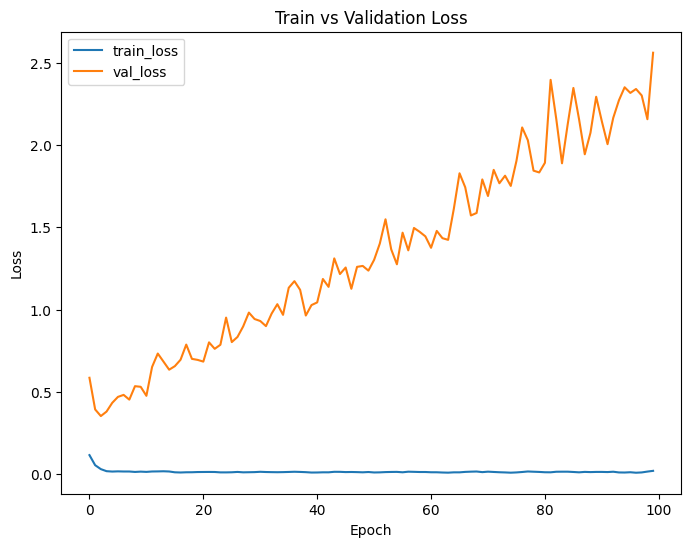

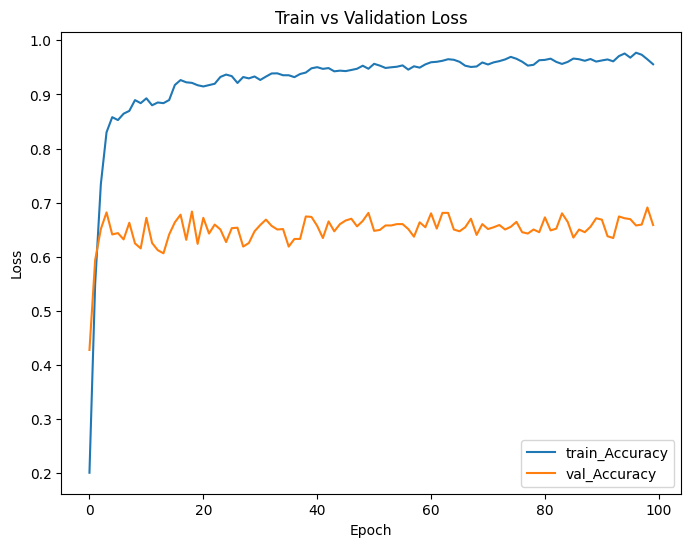

In [ ]:
from trainer import Trainer
from model.baseline import BirdClassifier, EfficientBirdClassifier
model = EfficientBirdClassifier()
trainer = Trainer(model,train_loader, test_loader, "baseline_efficientnet_10000")
trainer.train(epochs = 10000)

In [ ]:
print(model)

BirdClassifier(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
     

: 

: 